In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
from itertools import permutations

from scipy.stats import skew

import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Ridge, Lasso

import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import ElasticNet
import lightgbm as lgb
from sklearn.neighbors import KNeighborsRegressor

import pickle

## Problem Statment


## Predict The Oil Production 

In [3]:
df = pd.read_csv("./data/oil_gas_data.csv")
df

,treatment company,azimuth,md (ft),tvd (ft),date on production,operator,footage lateral length,well spacing,porpoise deviation,porpoise count,...,p-velocity,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production
0,treatment company 1,-32.279999,19148,6443.0,3/1/2018,operator 1,11966.0,4368.46290,6.33,12,...,13592.23,6950.44,30.82,4149.0,NaN,83,56,21568792.0,1.23,5614.947951
1,treatment company 2,-19.799999,15150,7602.0,7/1/2014,operator 2,6890.0,4714.99220,1.28,4,...,11735.04,7162.45,29.72,5776.0,NaN,102,33,9841307.0,1.47,2188.836707
2,treatment company 3,-26.879999,14950,5907.0,8/1/2018,operator 1,8793.0,798.92096,2.03,6,...,13227.81,6976.93,30.99,4628.0,NaN,88,62,17116240.0,1.67,1450.033022
3,treatment company 4,-49.099998,11098,6538.0,1/1/2012,operator 1,4234.0,NaN,6.00,23,...,12646.34,6799.37,26.20,4582.0,NaN,100,11,3749559.0,0.77,1060.764407
4,treatment company 5,5.560000,10549,7024.0,1/1/2012,operator 3,2972.0,2967.56300,11.87,9,...,13192.18,7046.91,31.18,4909.0,NaN,94,9,6690705.0,1.32,607.530385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,treatment company 10,-15.980000,13750,7301.0,8/1/2017,operator 6,6006.0,1438.41020,6.30,7,...,13493.47,6853.18,30.59,5235.0,NaN,90,20,7062412.0,1.21,4395.234931
996,treatment company 23,-18.080000,17333,6551.0,3/1/2018,operator 4,10279.0,764.44165,2.54,17,...,13166.54,7031.03,31.14,3796.0,NaN,94,51,NaN,1.34,2263.065149
997,treatment company 4,-34.430000,19772,7598.0,10/1/2018,operator 4,11568.0,569.40991,6.73,8,...,12587.95,7250.19,32.20,5751.0,NaN,88,58,21720556.0,1.14,4094.018209
998,treatment company 5,-28.540001,11920,5475.0,8/1/2018,operator 22,5929.0,NaN,6.44,7,...,13507.64,6877.28,30.66,4339.0,NaN,100,32,13430880.0,0.95,1000.295063


In [4]:
row_count = df.shape[0]
col_count = df.shape[1]
print('Row Count :',row_count)
print('Column Count :',col_count)

Row Count : 1000
Column Count : 28


In [5]:
df.columns

Index(['treatment company', 'azimuth', 'md (ft)', 'tvd (ft)',
       'date on production', 'operator', 'footage lateral length',
       'well spacing', 'porpoise deviation', 'porpoise count', 'shale footage',
       'acoustic impedance', 'log permeability', 'porosity', 'poisson ratio',
       'water saturation', 'toc', 'vcl', 'p-velocity', 's-velocity',
       'youngs modulus', 'isip', 'breakdown pressure', 'pump rate',
       'total number of stages', 'proppant volume', 'proppant fluid ratio',
       'production'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   treatment company       1000 non-null   object 
 1   azimuth                 945 non-null    float64
 2   md (ft)                 1000 non-null   int64  
 3   tvd (ft)                980 non-null    float64
 4   date on production      1000 non-null   object 
 5   operator                1000 non-null   object 
 6   footage lateral length  1000 non-null   float64
 7   well spacing            844 non-null    float64
 8   porpoise deviation      1000 non-null   float64
 9   porpoise count          1000 non-null   int64  
 10  shale footage           1000 non-null   int64  
 11  acoustic impedance      1000 non-null   float64
 12  log permeability        1000 non-null   float64
 13  porosity                881 non-null    float64
 14  poisson ratio           1000 non-null   f

In [7]:
df.isna()

,treatment company,azimuth,md (ft),tvd (ft),date on production,operator,footage lateral length,well spacing,porpoise deviation,porpoise count,...,p-velocity,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
3,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,True,False,False
997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,True,False,False,False,False,False
998,False,False,False,False,False,False,False,True,False,False,...,False,False,False,False,True,False,False,False,False,False


In [8]:
df.isnull().sum()

treatment company           0
azimuth                    55
md (ft)                     0
tvd (ft)                   20
date on production          0
operator                    0
footage lateral length      0
well spacing              156
porpoise deviation          0
porpoise count              0
shale footage               0
acoustic impedance          0
log permeability            0
porosity                  119
poisson ratio               0
water saturation          577
toc                        21
vcl                         0
p-velocity                  0
s-velocity                  0
youngs modulus             19
isip                       77
breakdown pressure        744
pump rate                   0
total number of stages      0
proppant volume           132
proppant fluid ratio        0
production                  0
dtype: int64

In [9]:
df.isna().mean()*100

treatment company          0.0
azimuth                    5.5
md (ft)                    0.0
tvd (ft)                   2.0
date on production         0.0
operator                   0.0
footage lateral length     0.0
well spacing              15.6
porpoise deviation         0.0
porpoise count             0.0
shale footage              0.0
acoustic impedance         0.0
log permeability           0.0
porosity                  11.9
poisson ratio              0.0
water saturation          57.7
toc                        2.1
vcl                        0.0
p-velocity                 0.0
s-velocity                 0.0
youngs modulus             1.9
isip                       7.7
breakdown pressure        74.4
pump rate                  0.0
total number of stages     0.0
proppant volume           13.2
proppant fluid ratio       0.0
production                 0.0
dtype: float64

In [10]:
df.describe()

,azimuth,md (ft),tvd (ft),footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,log permeability,...,p-velocity,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production
count,945.000000,1000.000000,980.000000,1000.000000,844.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,...,1000.000000,1000.000000,981.000000,923.000000,256.000000,1000.000000,1000.000000,8.680000e+02,1000.00000,1000.000000
mean,-33.905735,13988.387000,7103.620408,6387.049510,2223.227174,50.457090,9.443000,3784.827000,33492.835400,0.623570,...,12766.714230,6933.582230,30.275525,4965.485374,7365.949219,85.052000,28.815000,1.060880e+07,1.16613,1949.919511
std,17.975658,2584.315924,896.947293,2520.330314,1255.063341,118.436695,6.882596,3703.775191,2074.387344,0.392759,...,713.112641,179.966553,1.488059,778.399766,1484.094160,12.510308,15.518234,6.404058e+06,0.37555,1351.485865
min,-87.250000,8642.000000,4859.000000,1329.000000,335.458620,0.030000,0.000000,0.000000,26740.050000,-0.030000,...,10631.340000,6374.620000,25.640000,2149.000000,4364.000000,2.000000,9.000000,1.760960e+05,0.03000,76.107246
25%,-46.220001,12157.500000,6407.000000,4668.000000,1084.525475,4.660000,4.000000,0.000000,32718.460000,0.310000,...,12230.625000,6808.660000,29.720000,4391.500000,6102.750000,77.000000,16.000000,6.146848e+06,0.95000,1003.897453
50%,-32.990002,13659.500000,6977.000000,5927.000000,1999.295250,10.880000,8.000000,3591.500000,34592.225000,0.520000,...,13158.920000,6958.975000,30.840000,4927.000000,7018.000000,86.000000,26.000000,9.082286e+06,1.12000,1568.681918
75%,-22.580000,15468.000000,7820.000000,7744.000000,3090.201450,30.537500,13.000000,6081.750000,34819.790000,0.870000,...,13272.570000,7037.292500,31.130000,5550.500000,8868.250000,95.000000,39.000000,1.366105e+07,1.33000,2621.207163
max,22.940001,27797.000000,9639.000000,19849.000000,5225.089400,1106.130000,39.000000,17763.000000,38057.630000,1.940000,...,14501.580000,7491.530000,33.100000,9295.000000,11116.000000,110.000000,110.000000,4.195037e+07,5.41000,8880.671151


In [11]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
azimuth,945.0,-3.390574e+01,1.797566e+01,-87.250000,-4.622000e+01,-3.299000e+01,-2.258000e+01,2.294000e+01
md (ft),1000.0,1.398839e+04,2.584316e+03,8642.000000,1.215750e+04,1.365950e+04,1.546800e+04,2.779700e+04
tvd (ft),980.0,7.103620e+03,8.969473e+02,4859.000000,6.407000e+03,6.977000e+03,7.820000e+03,9.639000e+03
footage lateral length,1000.0,6.387050e+03,2.520330e+03,1329.000000,4.668000e+03,5.927000e+03,7.744000e+03,1.984900e+04
well spacing,844.0,2.223227e+03,1.255063e+03,335.458620,1.084525e+03,1.999295e+03,3.090201e+03,5.225089e+03
porpoise deviation,1000.0,5.045709e+01,1.184367e+02,0.030000,4.660000e+00,1.088000e+01,3.053750e+01,1.106130e+03
porpoise count,1000.0,9.443000e+00,6.882596e+00,0.000000,4.000000e+00,8.000000e+00,1.300000e+01,3.900000e+01
shale footage,1000.0,3.784827e+03,3.703775e+03,0.000000,0.000000e+00,3.591500e+03,6.081750e+03,1.776300e+04
acoustic impedance,1000.0,3.349284e+04,2.074387e+03,26740.050000,3.271846e+04,3.459222e+04,3.481979e+04,3.805763e+04
log permeability,1000.0,6.235700e-01,3.927587e-01,-0.030000,3.100000e-01,5.200000e-01,8.700000e-01,1.940000e+00


## Detect Outliers

<Axes: >

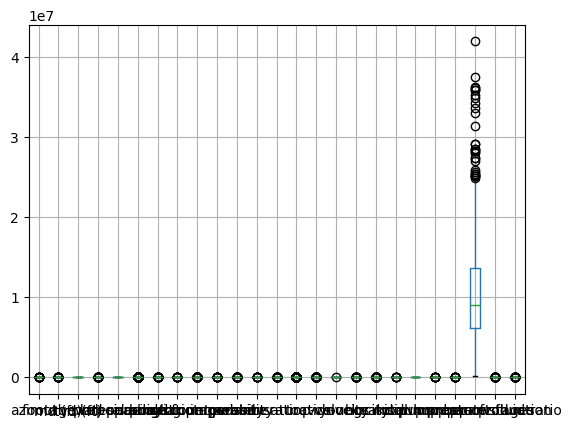

In [12]:
df.boxplot()

## fill outliers with mean & median with Inter Quartile Range

In [13]:
replacement_strategy = {
    'proppant volume': 'mean',
    'breakdown pressure': 'mean',
    'isip': 'mean',
    'youngs modulus': 'median',
    'toc': 'mean',
    'water saturation': 'mean',
    'porosity': 'mean',
    'well spacing': 'mean',
    'tvd (ft)': 'median',
    'azimuth': 'mean'
}

for col, strategy in replacement_strategy.items():
    if strategy == 'mean':
        fill_value = df[col].mean()
    else:
        fill_value = df[col].median()

    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
    df.loc[outliers, col] = fill_value
    df[col].fillna(fill_value, inplace=True)
# Now df contains columns with outliers and missing values replaced according to the defined strategies

## Check if outliers are replaced or not

In [14]:
df.isnull().sum()

treatment company         0
azimuth                   0
md (ft)                   0
tvd (ft)                  0
date on production        0
operator                  0
footage lateral length    0
well spacing              0
porpoise deviation        0
porpoise count            0
shale footage             0
acoustic impedance        0
log permeability          0
porosity                  0
poisson ratio             0
water saturation          0
toc                       0
vcl                       0
p-velocity                0
s-velocity                0
youngs modulus            0
isip                      0
breakdown pressure        0
pump rate                 0
total number of stages    0
proppant volume           0
proppant fluid ratio      0
production                0
dtype: int64

In [15]:
df.isna().mean()*100

treatment company         0.0
azimuth                   0.0
md (ft)                   0.0
tvd (ft)                  0.0
date on production        0.0
operator                  0.0
footage lateral length    0.0
well spacing              0.0
porpoise deviation        0.0
porpoise count            0.0
shale footage             0.0
acoustic impedance        0.0
log permeability          0.0
porosity                  0.0
poisson ratio             0.0
water saturation          0.0
toc                       0.0
vcl                       0.0
p-velocity                0.0
s-velocity                0.0
youngs modulus            0.0
isip                      0.0
breakdown pressure        0.0
pump rate                 0.0
total number of stages    0.0
proppant volume           0.0
proppant fluid ratio      0.0
production                0.0
dtype: float64

In [16]:
columns = df.columns
print(columns)

Index(['treatment company', 'azimuth', 'md (ft)', 'tvd (ft)',
       'date on production', 'operator', 'footage lateral length',
       'well spacing', 'porpoise deviation', 'porpoise count', 'shale footage',
       'acoustic impedance', 'log permeability', 'porosity', 'poisson ratio',
       'water saturation', 'toc', 'vcl', 'p-velocity', 's-velocity',
       'youngs modulus', 'isip', 'breakdown pressure', 'pump rate',
       'total number of stages', 'proppant volume', 'proppant fluid ratio',
       'production'],
      dtype='object')


In [17]:
# Generate a permutation of all column combinations
column_permutations = list(permutations(columns, 2))

In [18]:
# Iterate through each permutation
for perm in column_permutations:
    x_col, y_col = perm[0], perm[1]

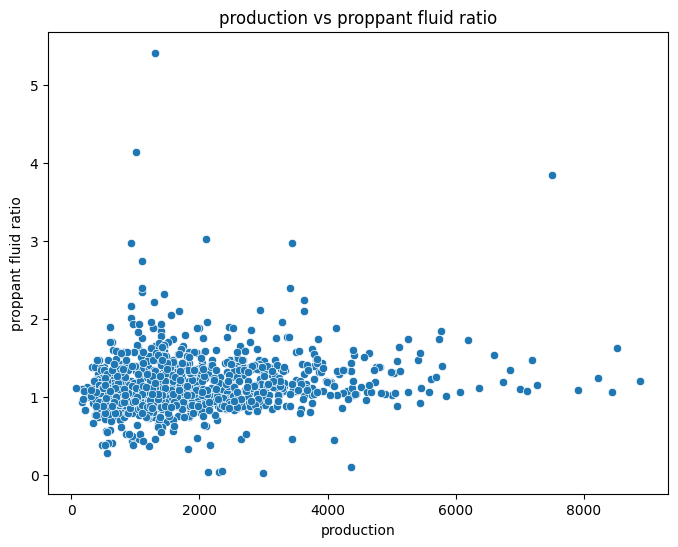

In [19]:
# Create scatter plot
plt.figure(figsize=(8, 6))
sns.scatterplot(x=x_col, y=y_col, data=df)
plt.title(f"{x_col} vs {y_col}")
plt.show()

In [20]:
# Calculate correlation
correlation = df[x_col].corr(df[y_col])
print(f"Correlation between {x_col} and {y_col}: {correlation}")

Correlation between production and proppant fluid ratio: 0.12925961460229934


In [21]:
# Combine Columns: Total Proppant Volume (Proppant Volume * Total Number of Stages)
df['total_proppant_volume'] = df['proppant volume'] * df['total number of stages']

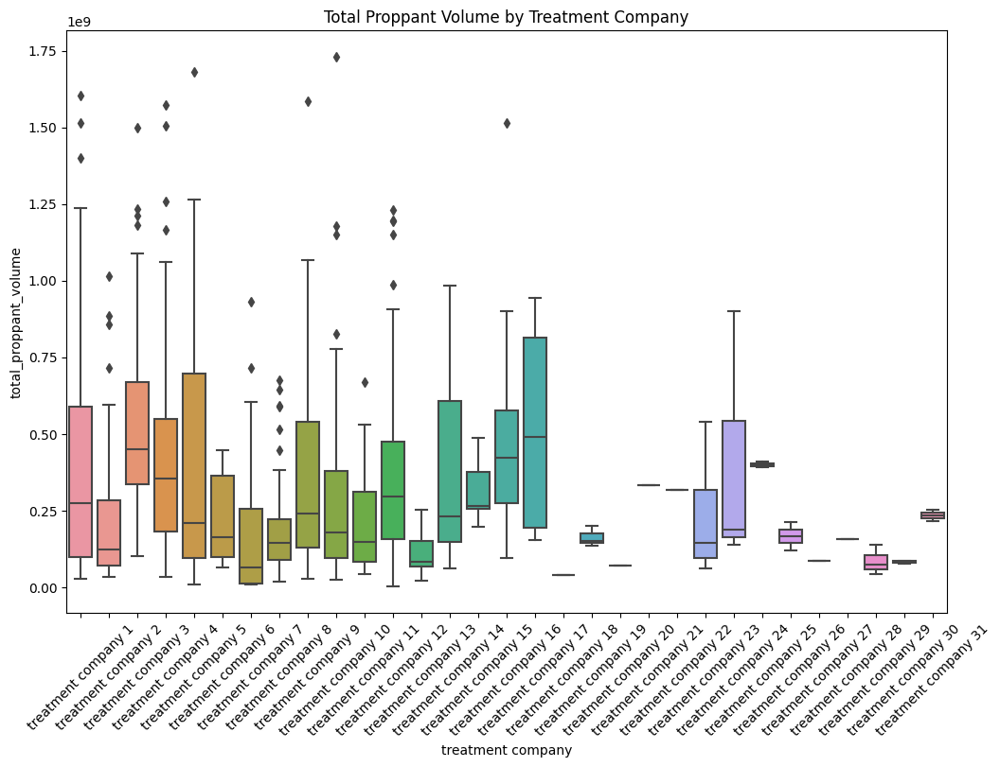

In [22]:
# EDA - Boxplots by Treatment Company for Total Proppant Volume
plt.figure(figsize=(12, 8))
sns.boxplot(x='treatment company', y='total_proppant_volume', data=df)
plt.xticks(rotation=45)
plt.title("Total Proppant Volume by Treatment Company")
plt.show()

In [23]:
# EDA - Group-wise Statistics by Operator
grouped_by_operator = df.groupby('operator').agg({
    'production': 'mean',
    'proppant volume': 'sum',
    'total number of stages': 'sum'
}).reset_index()

print(grouped_by_operator)

       operator   production  proppant volume  total number of stages
0    operator 1  1937.705967     1.108182e+09                    2630
1   operator 10  1373.773734     3.187844e+06                      11
2   operator 11  1435.374523     1.028703e+09                    3663
3   operator 12  1818.497676     8.371234e+07                     231
4   operator 13  1294.013673     1.843853e+08                     428
5   operator 14  4001.538568     6.754246e+08                    1819
6   operator 15  1104.524141     7.256135e+07                     198
7   operator 16  1679.703114     3.394319e+07                     186
8   operator 17  1670.973119     1.225313e+08                     373
9   operator 18  1384.522004     9.989858e+07                     415
10  operator 19   576.320887     1.114779e+08                     328
11   operator 2  1262.914562     3.655139e+08                     766
12  operator 20  1320.415322     2.853431e+08                     610
13  operator 21   50

### EDA -Insights

In [24]:
# 1. Operator 6 has the highest average production, highest total proppant volume, and total number of stages.
# 2. Operator 31 and Operator 34 have the lowest average production.
# 3. There seems to be a positive correlation between proppant volume and total number of stages.

In [30]:
# EDA - Scatter Plot Matrix for Selected Parameters
selected_params = ['azimuth', 'md (ft)', 'tvd (ft)', 'proppant volume', 'total number of stages', 'production']


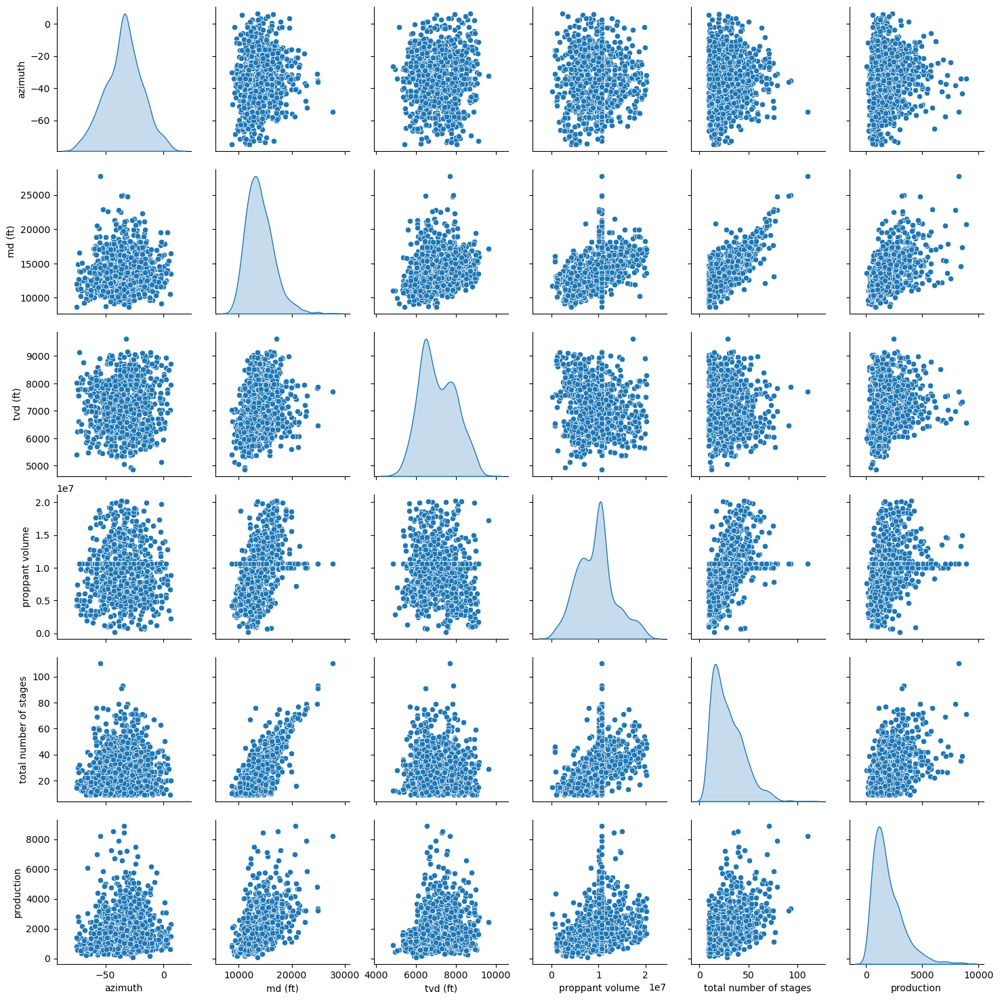

In [35]:
# EDA - Scatter Plot Matrix for Selected Parameters
selected_params = ['azimuth', 'md (ft)', 'tvd (ft)', 'proppant volume', 'total number of stages', 'production']
def scatter_plot(df):
    selected_params = ['azimuth', 'md (ft)', 'tvd (ft)', 'proppant volume', 'total number of stages', 'production']
    sns.pairplot(df[selected_params], diag_kind='kde')
    plt.show()
scatter_plot(df)

## EDA - Insights

In [36]:
# 1. There is a slight positive correlation between 'proppant volume' and 'total number of stages'.
# 2. There is no strong linear relationship between other parameters and 'production'.

In [25]:
# EDA - Permutation of Categorical and Numeric Parameters
categorical_cols = ['treatment company', 'operator']
numeric_cols = ['proppant volume', 'total number of stages', 'production']

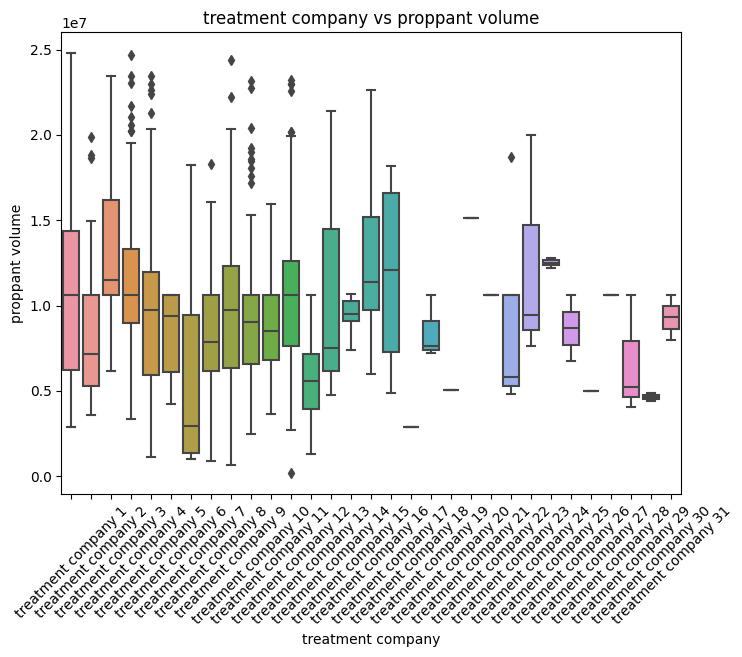

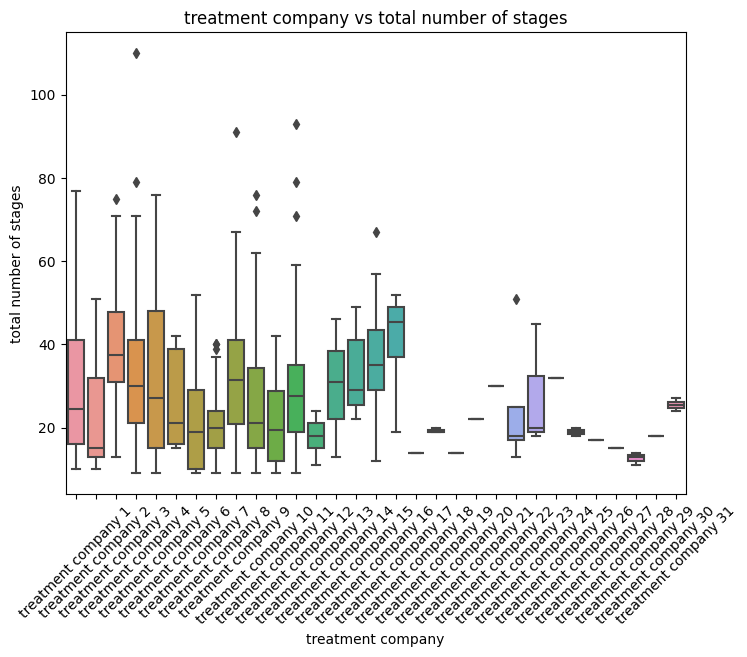

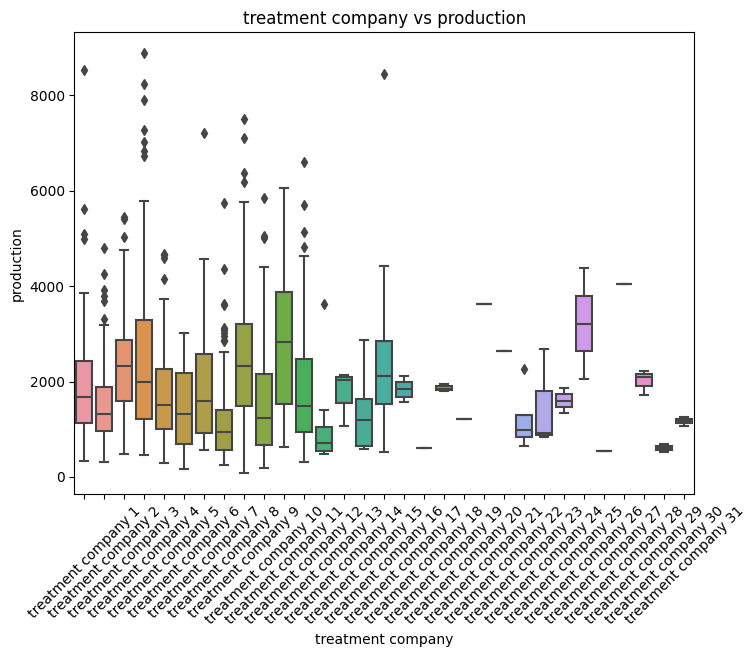

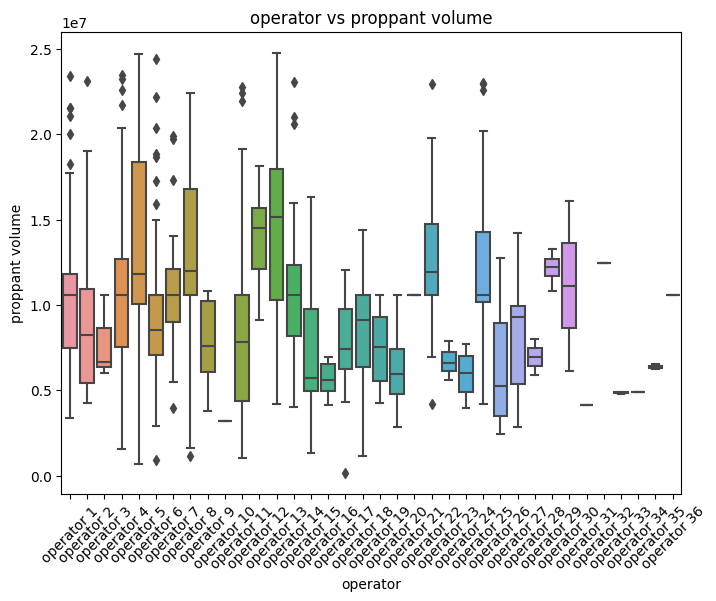

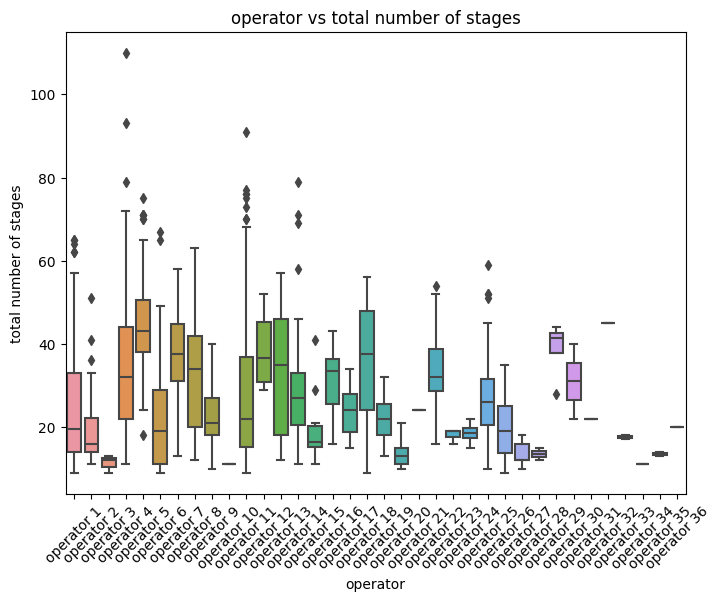

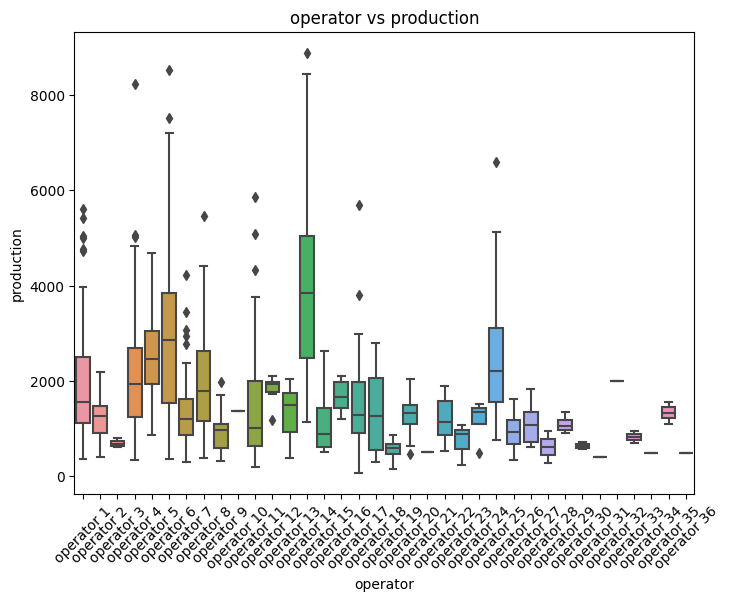

In [26]:
perm_combinations = list(permutations(categorical_cols + numeric_cols, 2))
for perm in perm_combinations:
    if perm[0] in categorical_cols and perm[1] in numeric_cols:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x=perm[0], y=perm[1], data=df)
        plt.xticks(rotation=45)
        plt.title(f"{perm[0]} vs {perm[1]}")
        plt.show()

## EDA - Insights


In [27]:
# 1. Operator 4 tends to have higher production and more total proppant volume.
# 2. Treatment Company 10 and 11 have higher proppant volumes and more total number of stages.

In [31]:
# EDA - Correlation Heatmap with Additional Columns
additional_cols = ['acoustic impedance', 'log permeability', 'porosity', 'p-velocity', 's-velocity', 'youngs modulus']
correlation_cols = selected_params + additional_cols

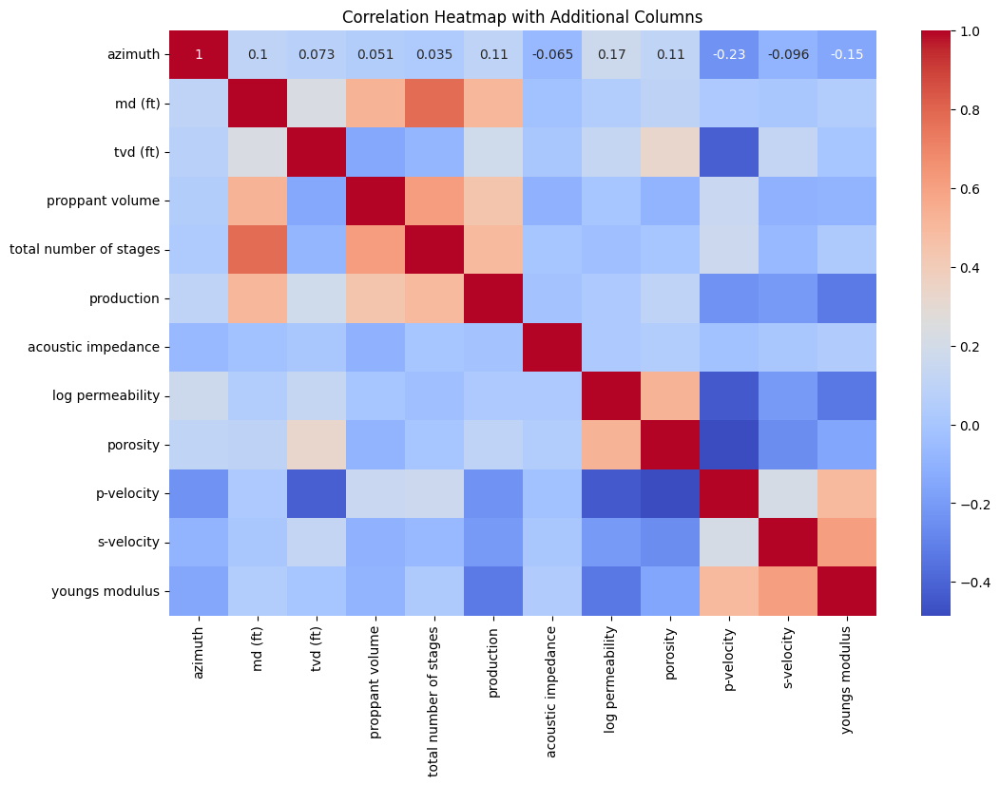

In [32]:
corr_matrix_additional = df[correlation_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_additional, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap with Additional Columns")
plt.show()

def correlation_heatmap():
    corr_matrix_additional = df[correlation_cols].corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix_additional, annot=True, cmap='coolwarm')
    plt.title("Correlation Heatmap with Additional Columns")
    plt.show()
    

## EDA - Insights

In [33]:
# 1. Proppant volume and total number of stages show positive correlation with production.
# 2. Young's modulus and porosity are positively correlated.

In [34]:
# Let's create a new column 'production_rate' by dividing 'production' by 'footage lateral length'
df['production_rate'] = df['production'] / df['footage lateral length']
df['production_rate']

0      0.469242
1      0.317683
2      0.164908
3      0.250535
4      0.204418
         ...   
995    0.731807
996    0.220164
997    0.353909
998    0.168712
999    0.983306
Name: production_rate, Length: 1000, dtype: float64

#### EDA - Insights

In [35]:
# 'production_rate' could indicate how efficient each well is in terms of production per lateral length.

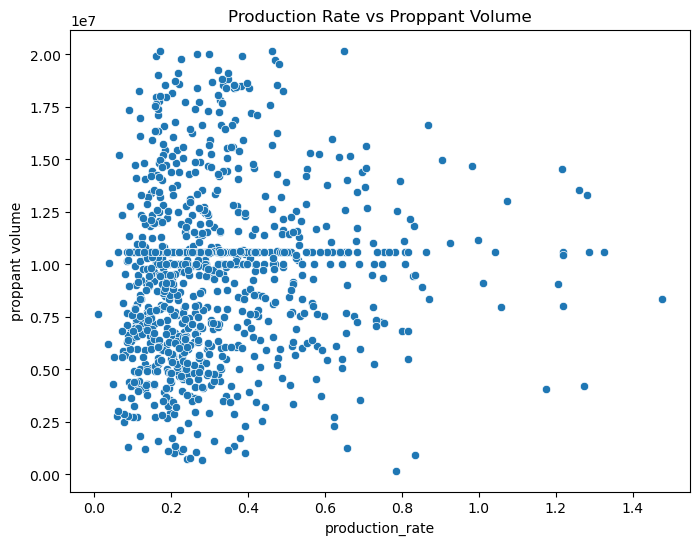

In [45]:
# EDA - Scatter Plot between 'production_rate' and 'proppant volume'

plt.figure(figsize=(8, 6))
sns.scatterplot(x='production_rate', y='proppant volume', data=df)
plt.title("Production Rate vs Proppant Volume")
plt.show()

def scatter_plot(df):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x='production_rate', y='proppant volume', data=df)
    plt.title("Production Rate vs Proppant Volume")
    plt.show()


#### EDA - Insights

In [36]:
# There seems to be a positive correlation between 'production_rate' and 'proppant volume'.
# Wells with higher proppant volume tend to have higher production rates.

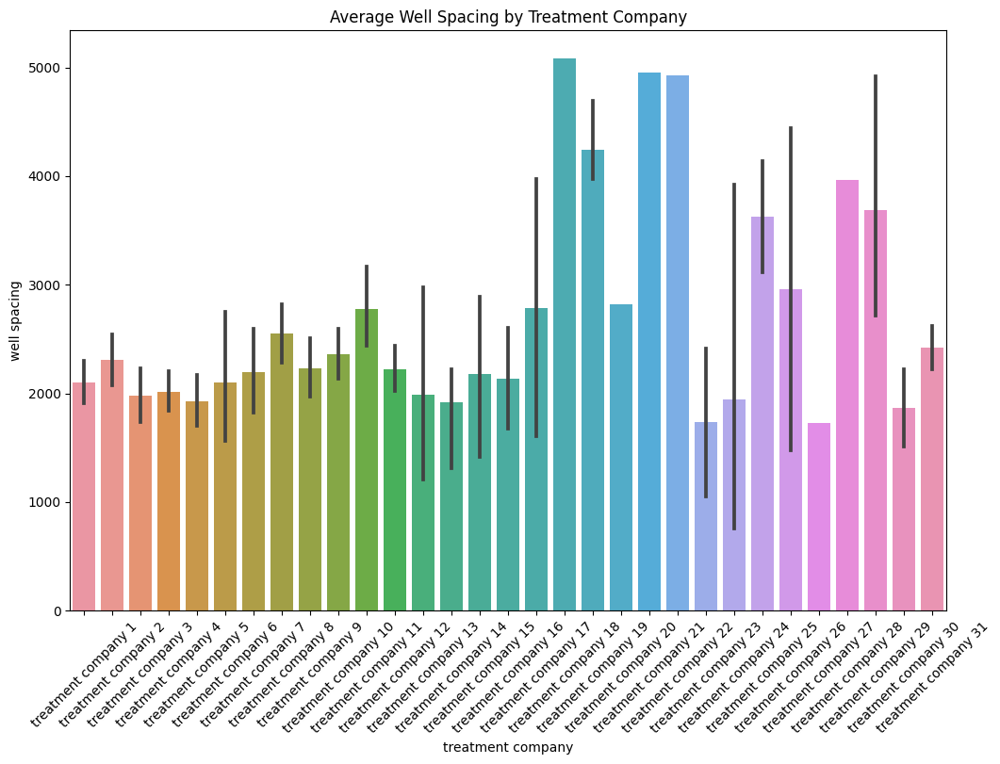

In [37]:
# EDA - Bar Plot of Well Spacing by Treatment Company
plt.figure(figsize=(12, 8))
sns.barplot(x='treatment company', y='well spacing', data=df)
plt.xticks(rotation=45)
plt.title("Average Well Spacing by Treatment Company")
plt.show()

### EDA - Insights

In [38]:
# Treatment Company 16 and 19 have the highest average well spacing.
# Treatment Company 21 and 25 have the lowest average well spacing.

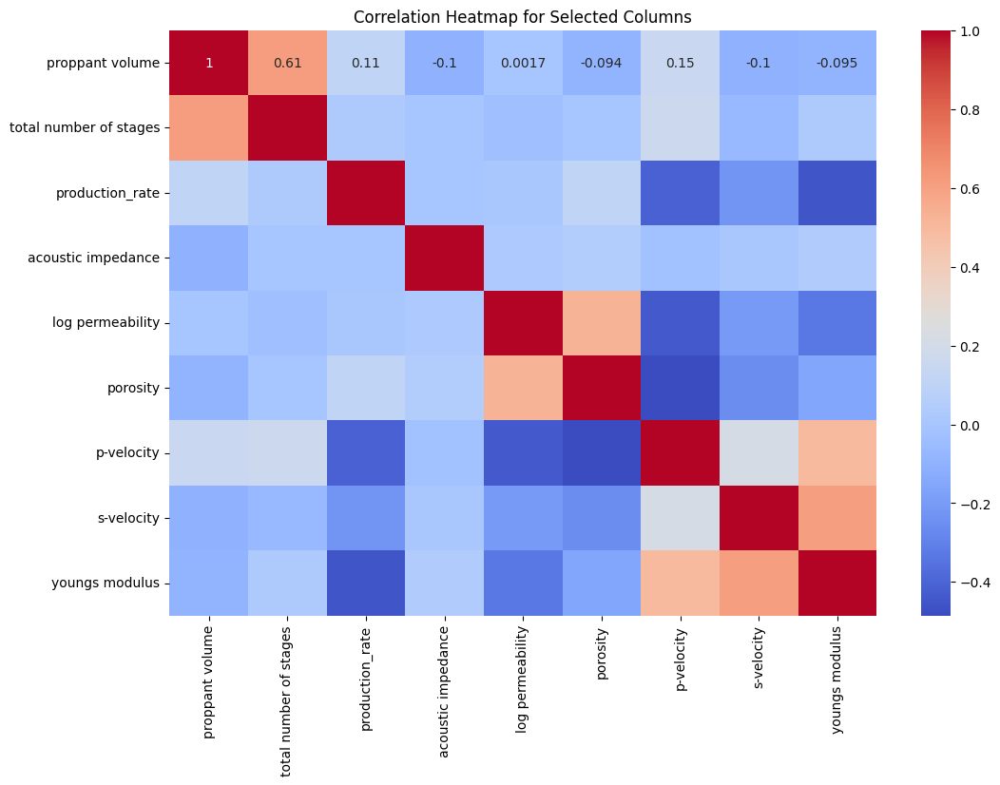

In [39]:
# EDA - Correlation Heatmap for Selected Columns
selected_cols = ['proppant volume', 'total number of stages', 'production_rate', 'acoustic impedance',
                 'log permeability', 'porosity', 'p-velocity', 's-velocity', 'youngs modulus']

corr_matrix_selected = df[selected_cols].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix_selected, annot=True, cmap='coolwarm')
plt.title("Correlation Heatmap for Selected Columns")
plt.show()

def heat_map(df):
        selected_cols = ['proppant volume', 'total number of stages', 'production_rate', 'acoustic impedance',
                 'log permeability', 'porosity', 'p-velocity', 's-velocity', 'youngs modulus']

        corr_matrix_selected = df[selected_cols].corr()
        plt.figure(figsize=(12, 8))
        sns.heatmap(corr_matrix_selected, annot=True, cmap='coolwarm')
        plt.title("Correlation Heatmap for Selected Columns")
        plt.show()  

### EDA - Insights

In [50]:
# 'production_rate' shows positive correlation with 'proppant volume' and 'total number of stages'.
# 'acoustic impedance' and 's-velocity' are negatively correlated.
# 'porosity' and 'log permeability' have a positive correlation.

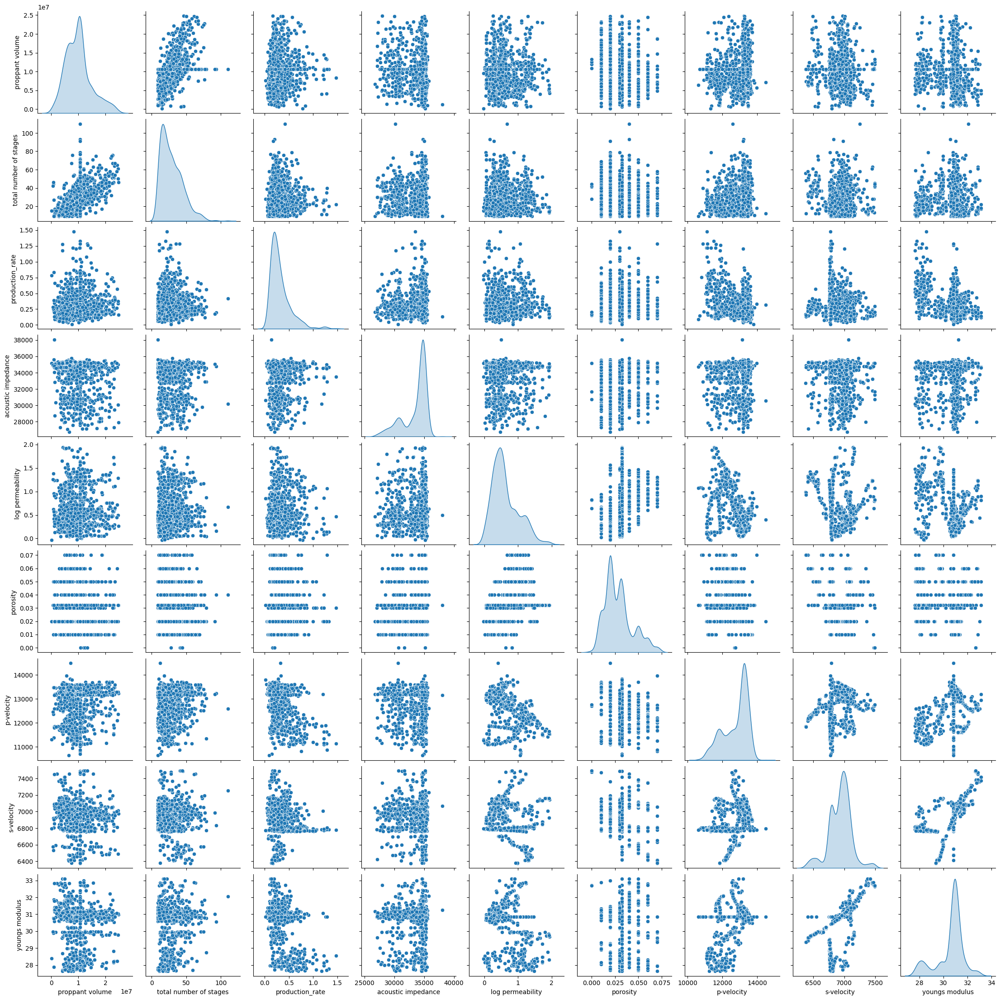

In [40]:
# EDA - Pairplot for Selected Columns
sns.pairplot(df[selected_cols], diag_kind='kde')
plt.show()

### EDA - Insights

In [41]:
# This pairplot provides visual insights into the relationships among selected columns.
# For example, 'production_rate' seems to be positively correlated with 'proppant volume' and 'total number of stages'.

### Checking Skewness

In [42]:
df.drop(['treatment company','operator',],axis=1,inplace=True)

In [43]:
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

azimuth
-0.07620960348196978


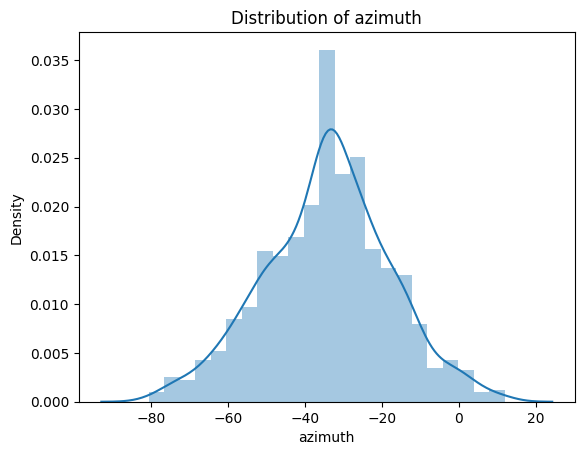

md (ft)
0.9306234949213487


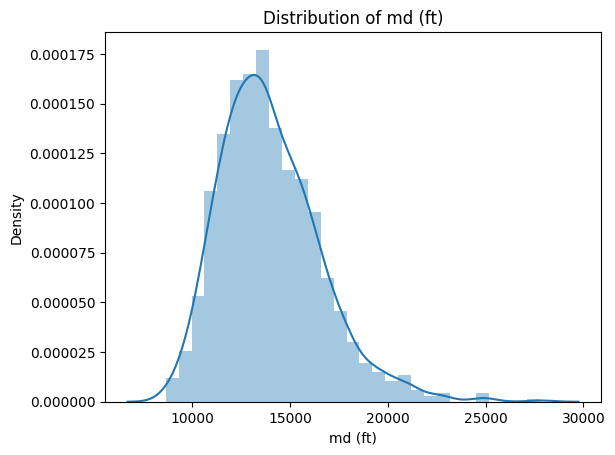

tvd (ft)
0.24433536280454154


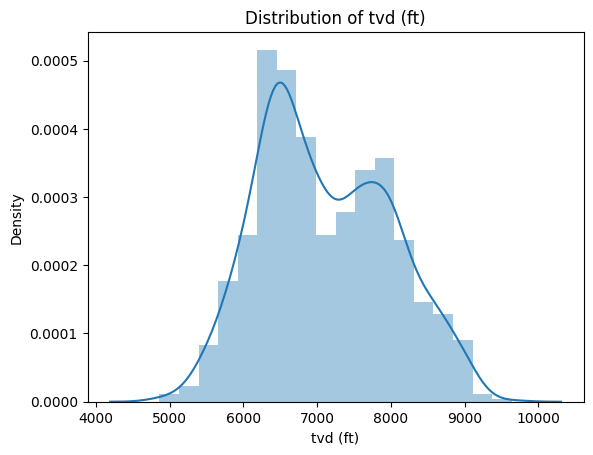

footage lateral length
1.128345655138382


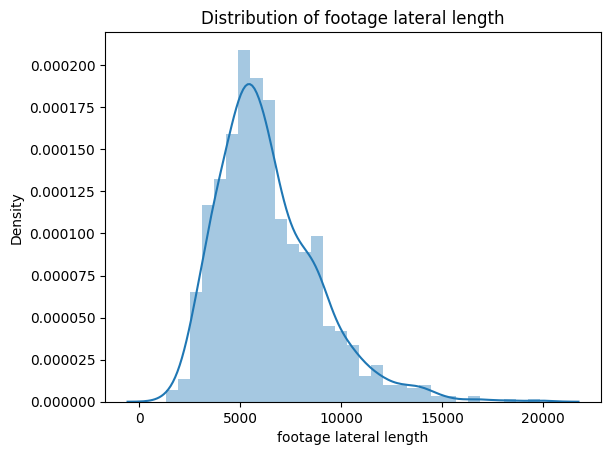

well spacing
0.6085610401915983


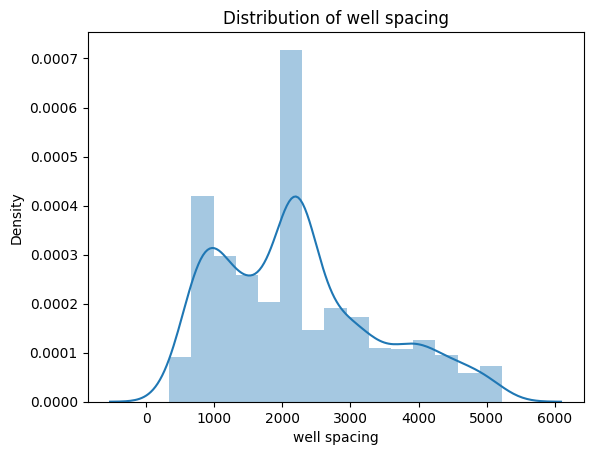

porpoise deviation
4.125257364508127


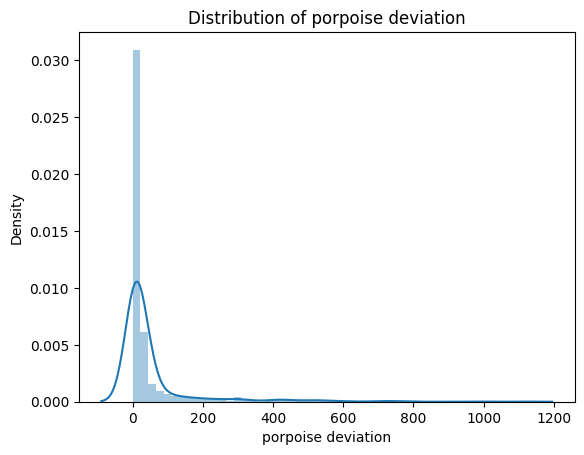

porpoise count
1.1394409274285697


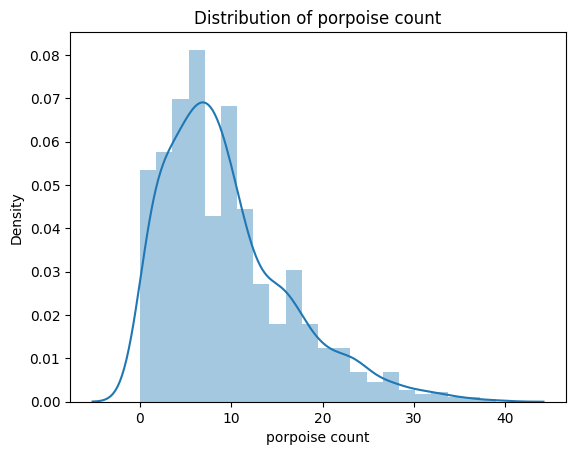

shale footage
0.8371132877987733


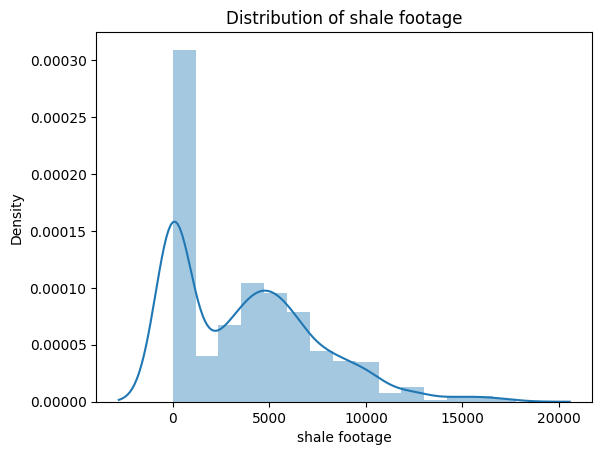

acoustic impedance
-1.2852691715613815


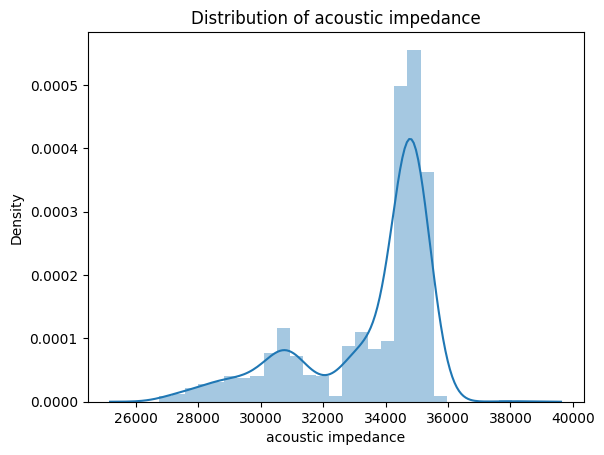

log permeability
0.888488459933091


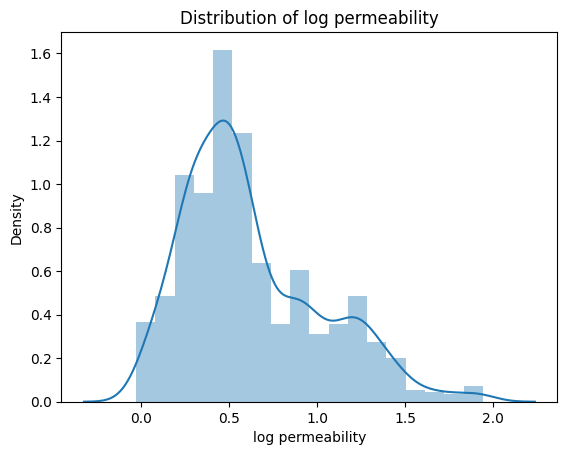

porosity
0.8468056279927045


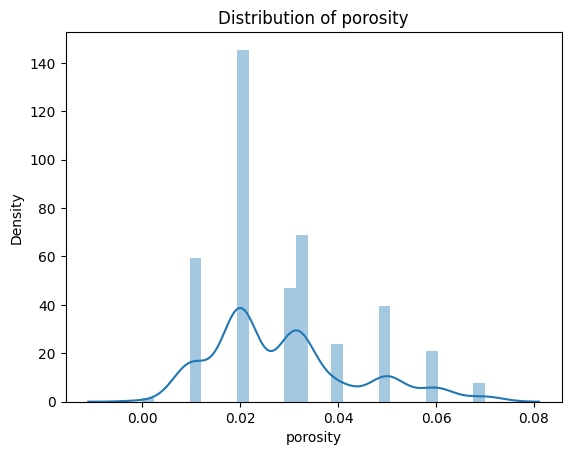

poisson ratio
-1.1476016181406499


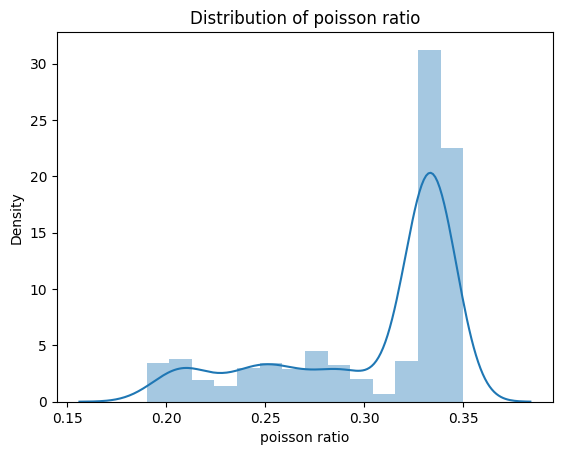

water saturation
0.1448755636958547


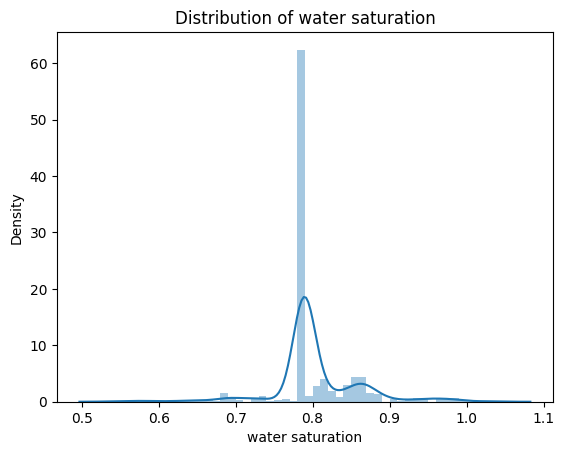

toc
-0.06432096351160246


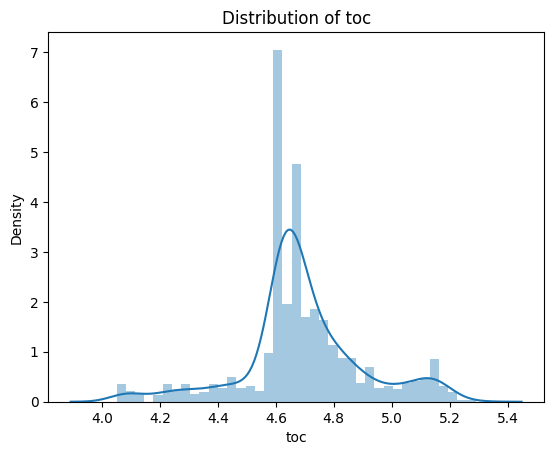

vcl
2.8621958380431884


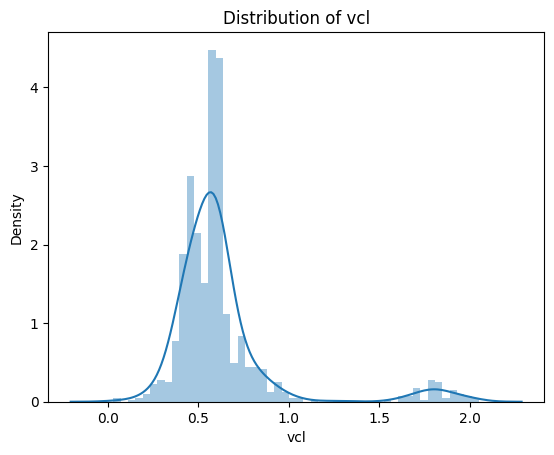

p-velocity
-0.7842505591380541


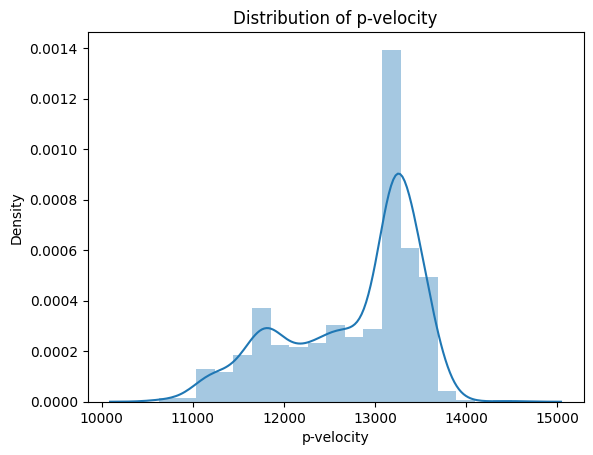

s-velocity
-0.2759306756225215


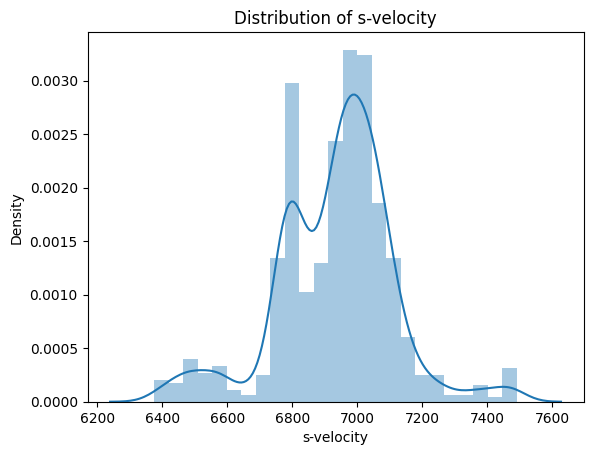

youngs modulus
-1.0270139678632946


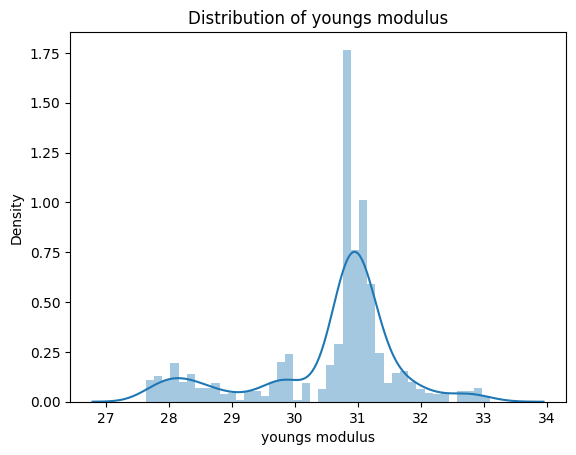

isip
0.0617190796254005


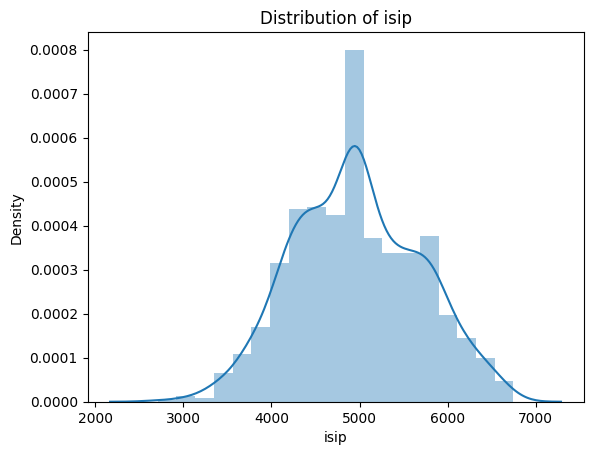

breakdown pressure
0.5058753915139227


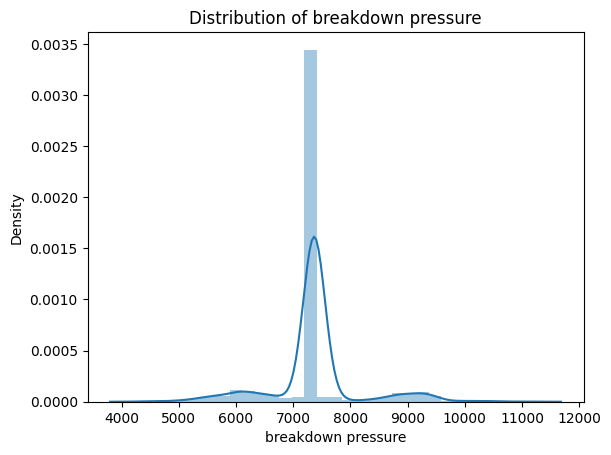

pump rate
-1.0688166964520904


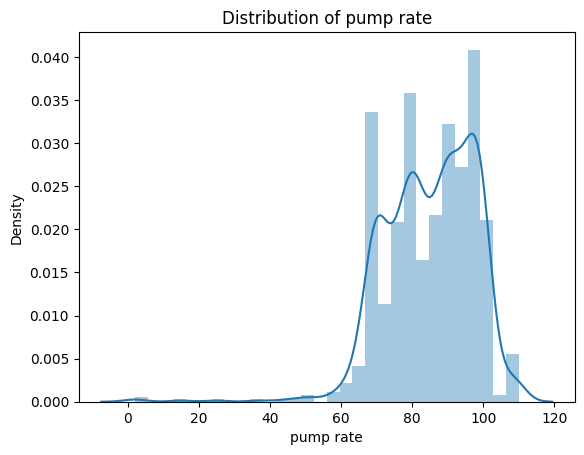

total number of stages
1.042920763096554


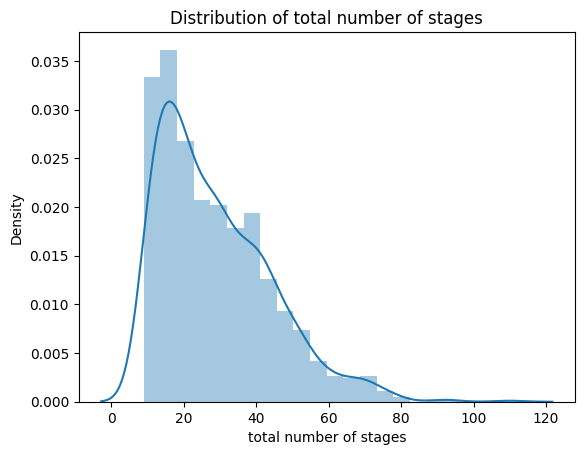

proppant volume
0.7281796062402945


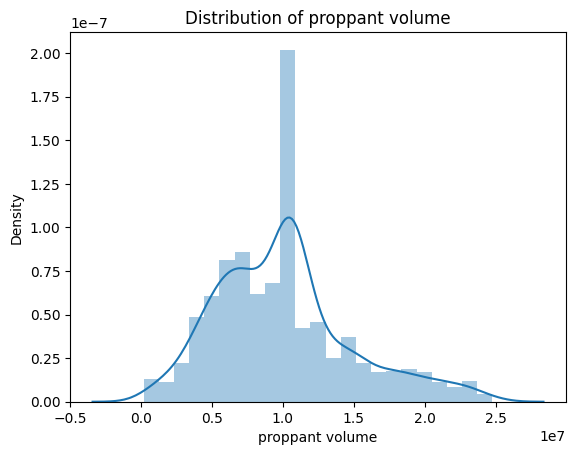

proppant fluid ratio
2.8346610759393043


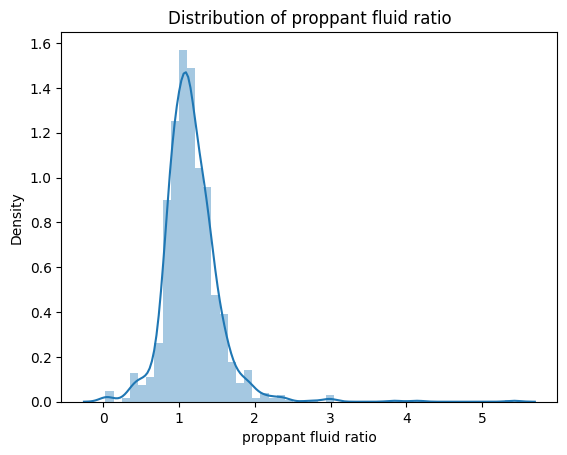

production
1.5871389691199769


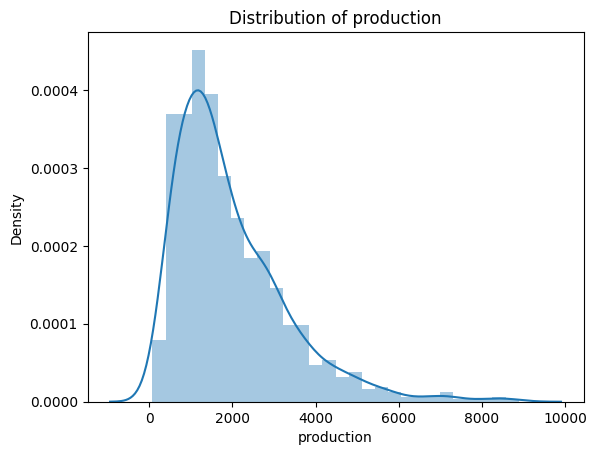

total_proppant_volume
1.545484480582163


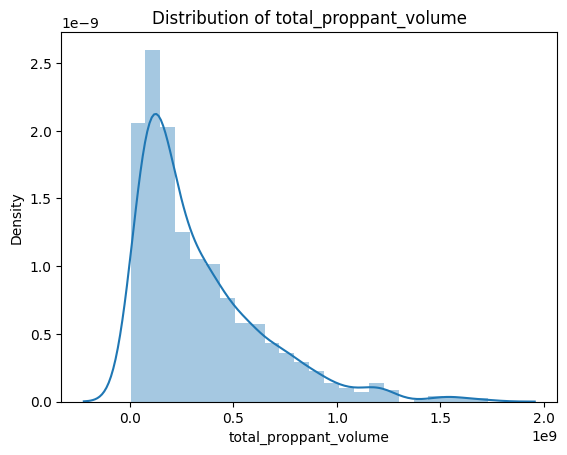

production_rate
1.8844505379992988


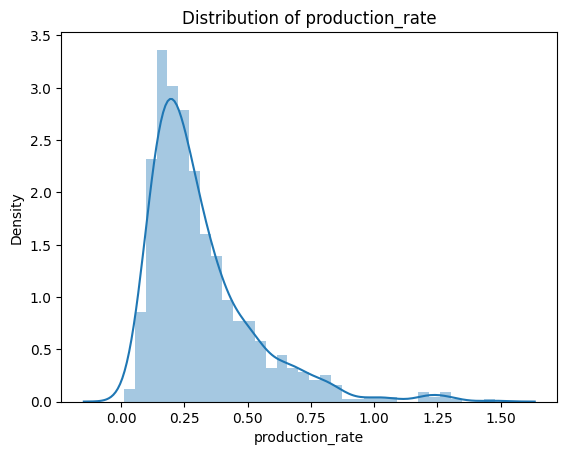

In [44]:
for col in numeric_cols:
    if col in df.columns:
        print(col)
        print(skew(df[col]))
        
        plt.figure()
        sns.distplot(df[col].dropna())  # Drop NA values before plotting
        plt.title(f"Distribution of {col}")
        plt.show()

In [45]:
print(df.dtypes)

azimuth                   float64
md (ft)                     int64
tvd (ft)                  float64
date on production         object
footage lateral length    float64
well spacing              float64
porpoise deviation        float64
porpoise count              int64
shale footage               int64
acoustic impedance        float64
log permeability          float64
porosity                  float64
poisson ratio             float64
water saturation          float64
toc                       float64
vcl                       float64
p-velocity                float64
s-velocity                float64
youngs modulus            float64
isip                      float64
breakdown pressure        float64
pump rate                   int64
total number of stages      int64
proppant volume           float64
proppant fluid ratio      float64
production                float64
total_proppant_volume     float64
production_rate           float64
dtype: object


### Checking Correlation

In [46]:
numeric_columns = df.select_dtypes(include=['int64', 'float64']).columns

In [47]:
correlation_matrix = df[numeric_columns].corr()
print(correlation_matrix)

                         azimuth   md (ft)  tvd (ft)  footage lateral length  \
azimuth                 1.000000  0.101063  0.073260                0.083504   
md (ft)                 0.101063  1.000000  0.233517                0.932205   
tvd (ft)                0.073260  0.233517  1.000000               -0.106877   
footage lateral length  0.083504  0.932205 -0.106877                1.000000   
well spacing            0.002995 -0.001131  0.002391               -0.006422   
porpoise deviation     -0.055823 -0.021909 -0.009362               -0.015157   
porpoise count          0.022421 -0.007777  0.001597               -0.011271   
shale footage          -0.028770 -0.020964  0.017124               -0.034346   
acoustic impedance     -0.065232 -0.024601  0.008029               -0.031960   
log permeability        0.169747  0.046531  0.131860                0.001960   
porosity                0.107509  0.099625  0.322438               -0.009963   
poisson ratio          -0.200673  0.1418

In [48]:
df['date on production'].value_counts().nunique()

27

In [49]:
df['date on production']

0       3/1/2018
1       7/1/2014
2       8/1/2018
3       1/1/2012
4       1/1/2012
         ...    
995     8/1/2017
996     3/1/2018
997    10/1/2018
998     8/1/2018
999     1/1/2014
Name: date on production, Length: 1000, dtype: object

In [50]:
df['date on production'] = pd.to_datetime(df['date on production']).astype('int64') // 10**9  # Convert nanoseconds to seconds
print(df)

       azimuth  md (ft)  tvd (ft)  date on production  footage lateral length  \
0   -32.279999    19148    6443.0          1519862400                 11966.0   
1   -19.799999    15150    7602.0          1404172800                  6890.0   
2   -26.879999    14950    5907.0          1533081600                  8793.0   
3   -49.099998    11098    6538.0          1325376000                  4234.0   
4     5.560000    10549    7024.0          1325376000                  2972.0   
..         ...      ...       ...                 ...                     ...   
995 -15.980000    13750    7301.0          1501545600                  6006.0   
996 -18.080000    17333    6551.0          1519862400                 10279.0   
997 -34.430000    19772    7598.0          1538352000                 11568.0   
998 -28.540001    11920    5475.0          1533081600                  5929.0   
999 -37.480000    15342    6555.0          1388534400                  7235.0   

     well spacing  porpoise

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 28 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   azimuth                 1000 non-null   float64
 1   md (ft)                 1000 non-null   int64  
 2   tvd (ft)                1000 non-null   float64
 3   date on production      1000 non-null   int64  
 4   footage lateral length  1000 non-null   float64
 5   well spacing            1000 non-null   float64
 6   porpoise deviation      1000 non-null   float64
 7   porpoise count          1000 non-null   int64  
 8   shale footage           1000 non-null   int64  
 9   acoustic impedance      1000 non-null   float64
 10  log permeability        1000 non-null   float64
 11  porosity                1000 non-null   float64
 12  poisson ratio           1000 non-null   float64
 13  water saturation        1000 non-null   float64
 14  toc                     1000 non-null   f

### Kdeplot

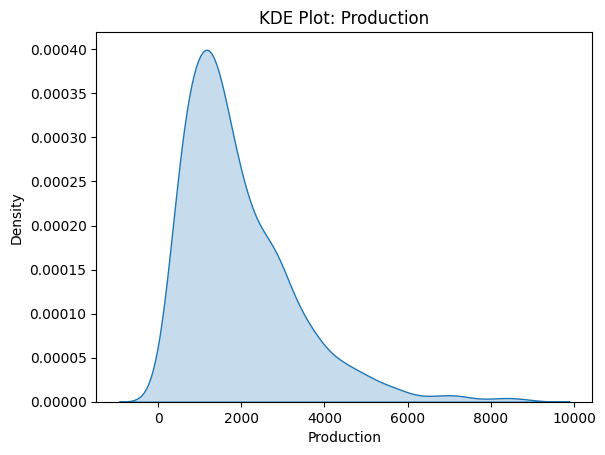

In [52]:
plt.figure()
sns.kdeplot(data=df['production'], shade=True)
plt.title('KDE Plot: Production')
plt.xlabel('Production')
plt.ylabel('Density')
plt.show()

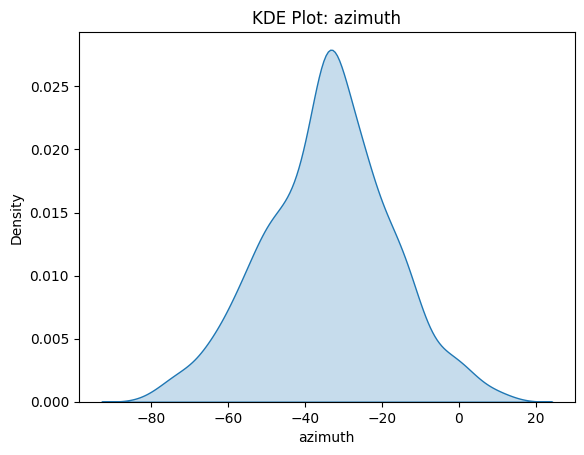

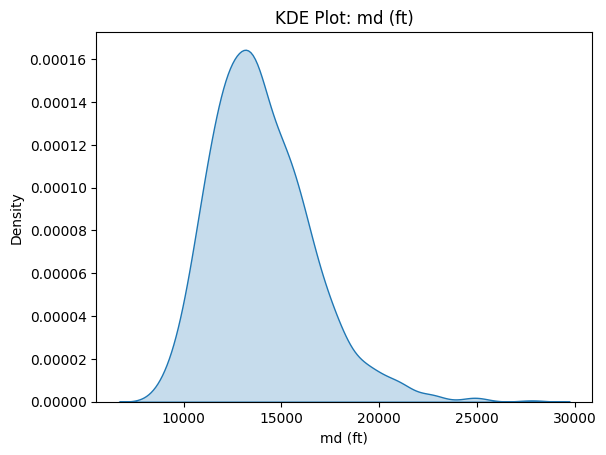

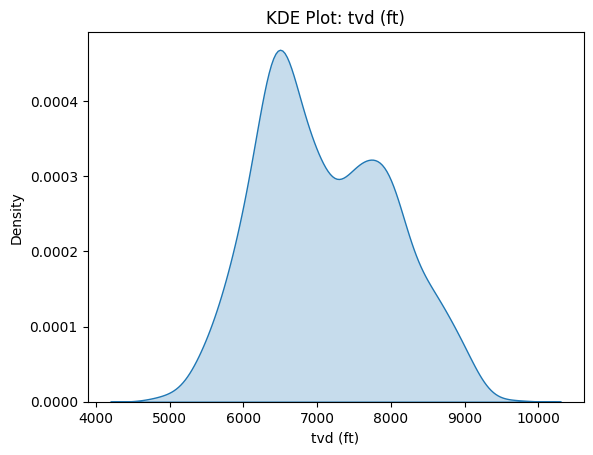

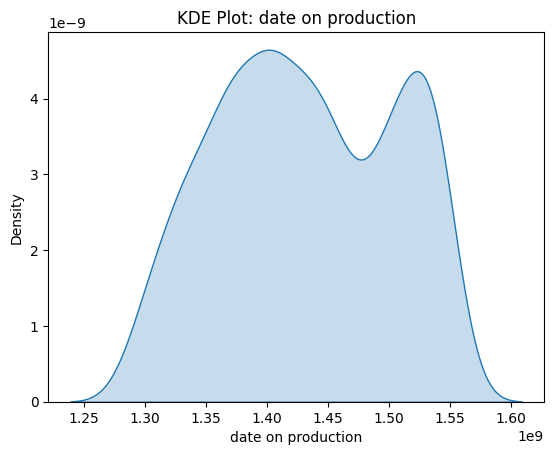

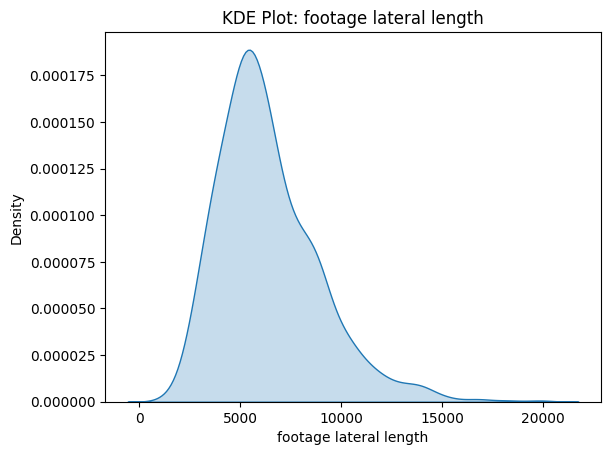

...

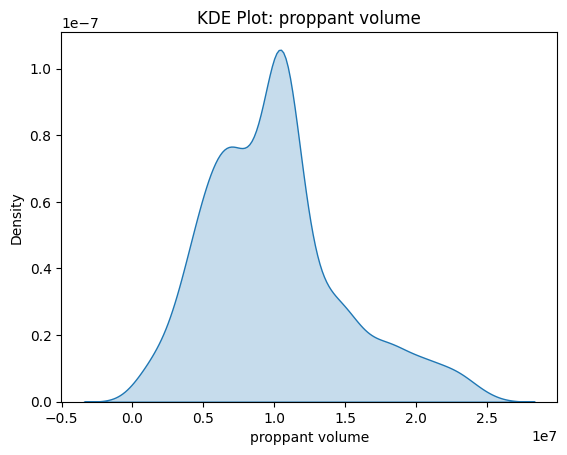

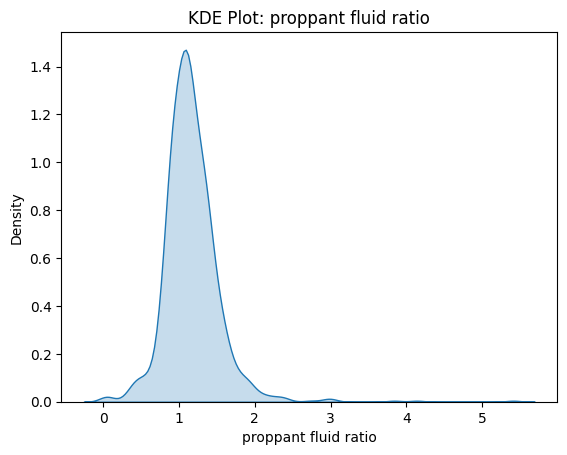

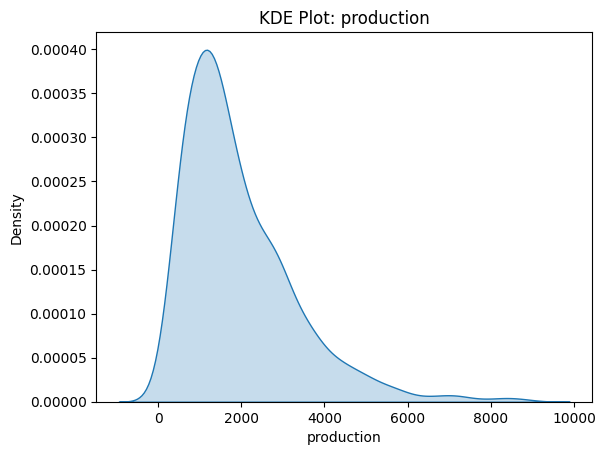

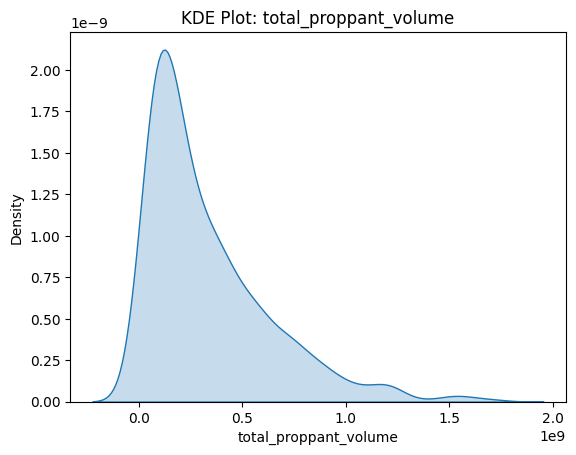

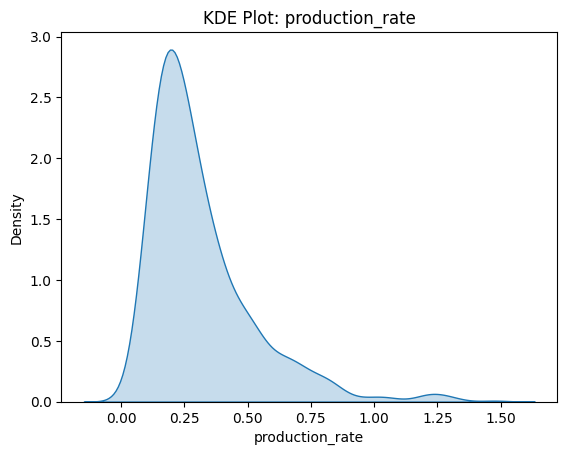

In [53]:
for col in df.select_dtypes(include=['number']):
    plt.figure()
    sns.kdeplot(data=df[col], shade=True)
    plt.title(f'KDE Plot: {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

### Countplot

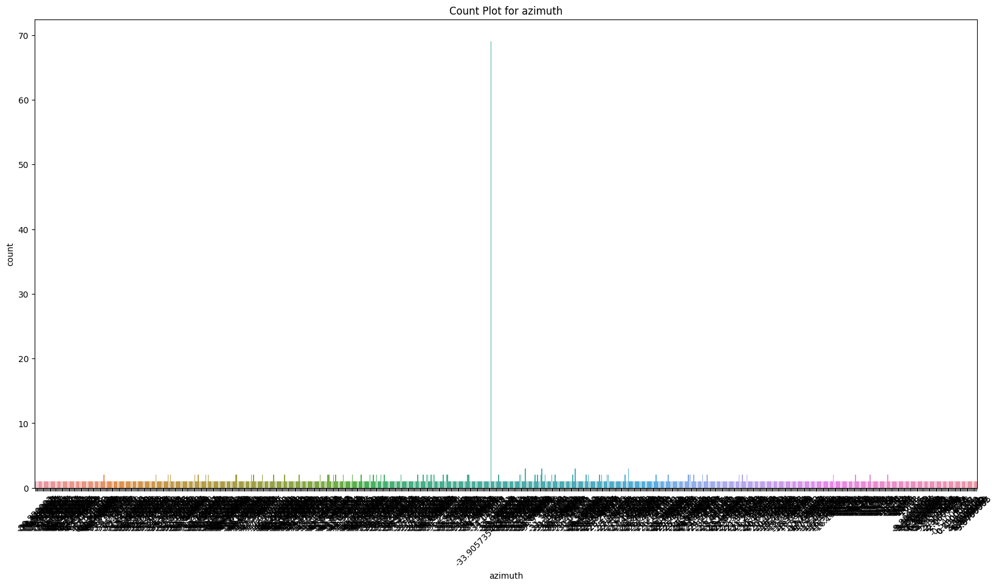

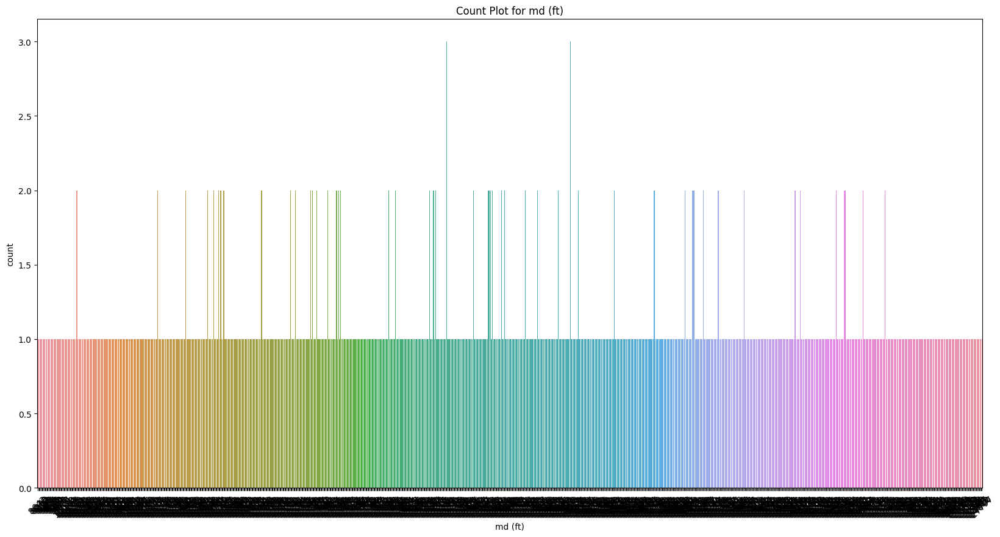

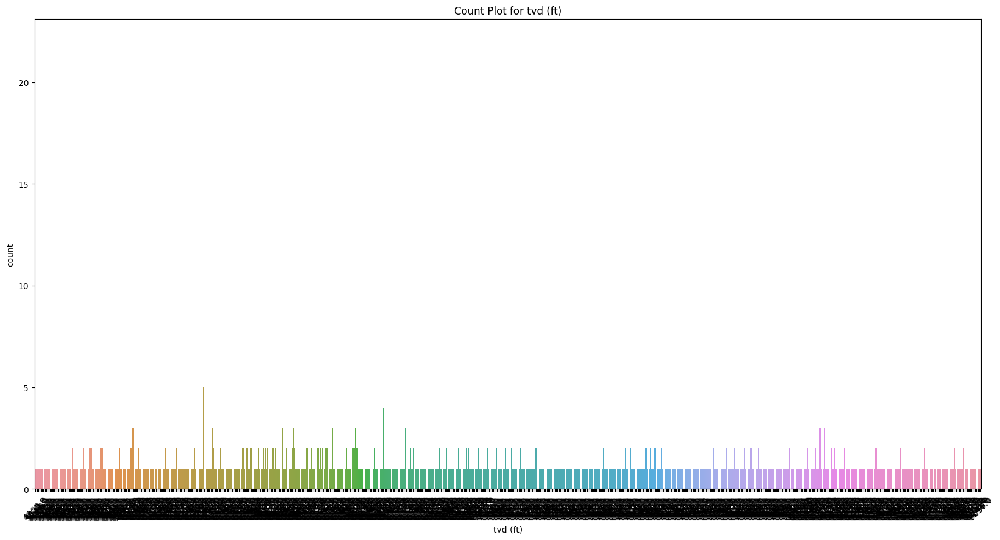

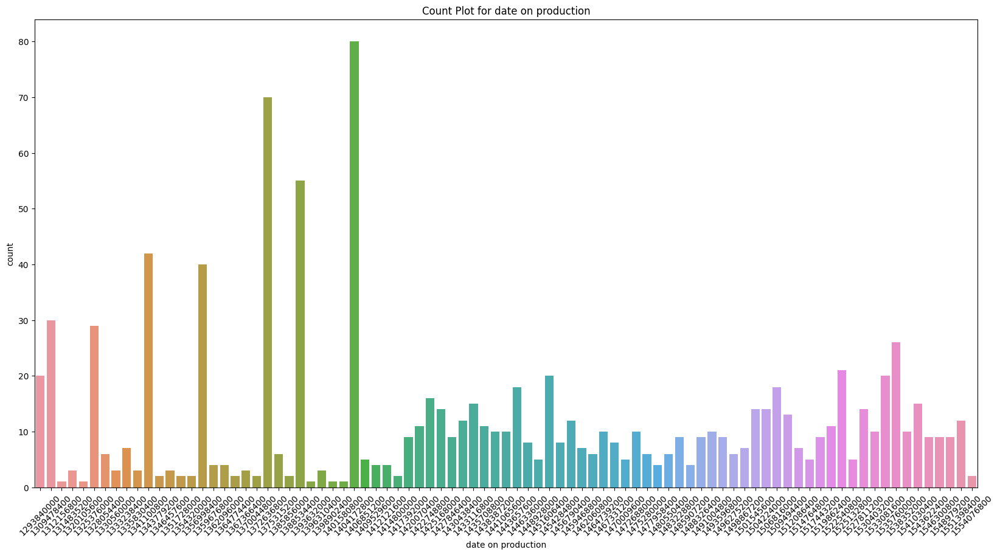

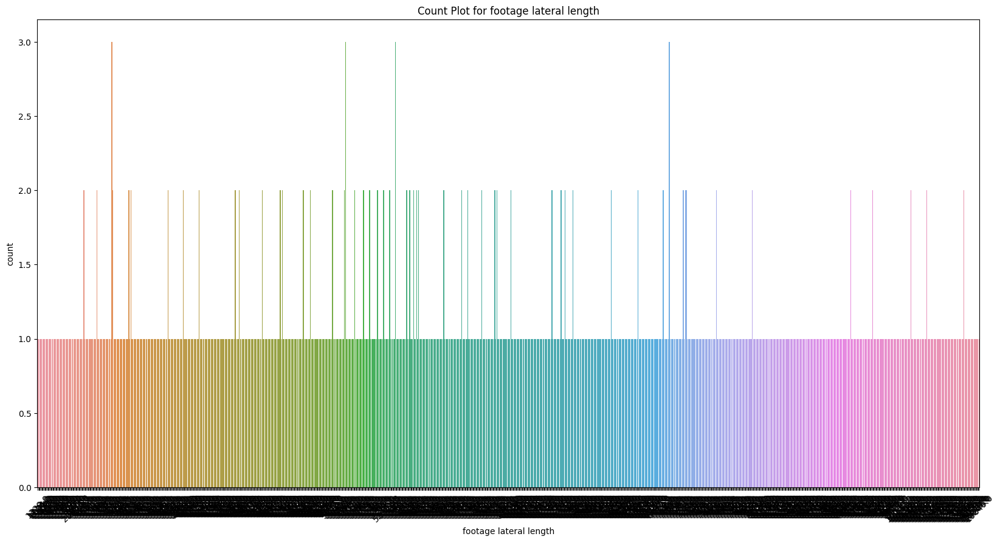

...

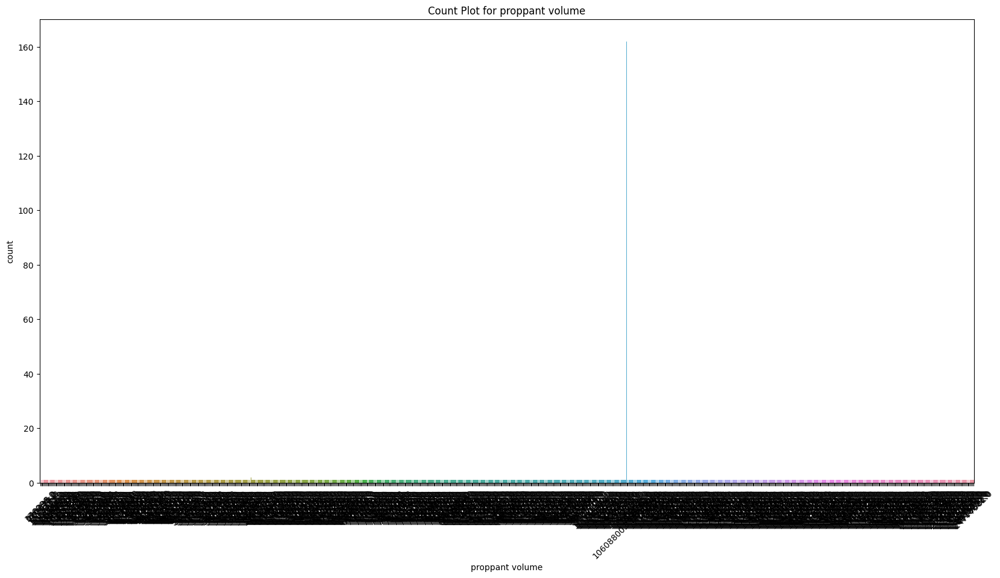

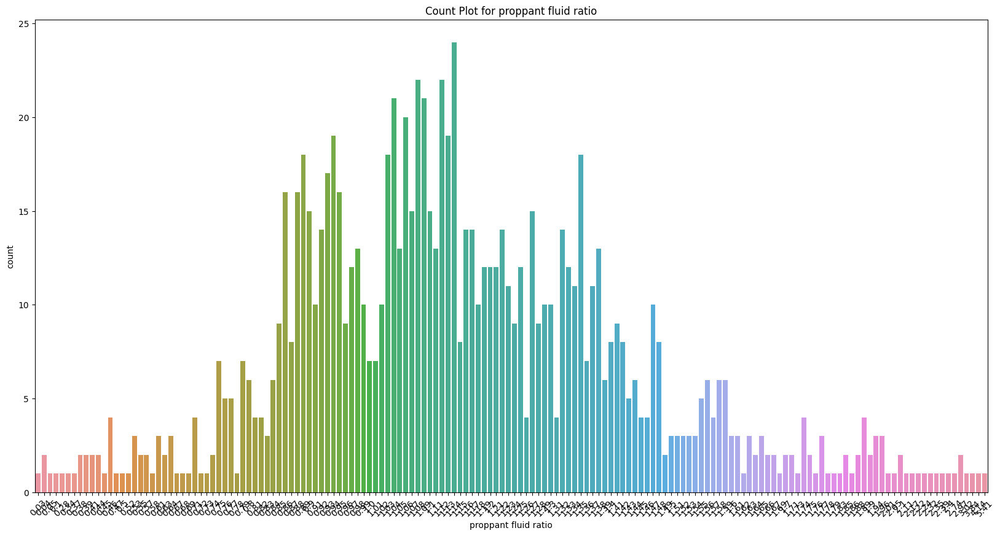

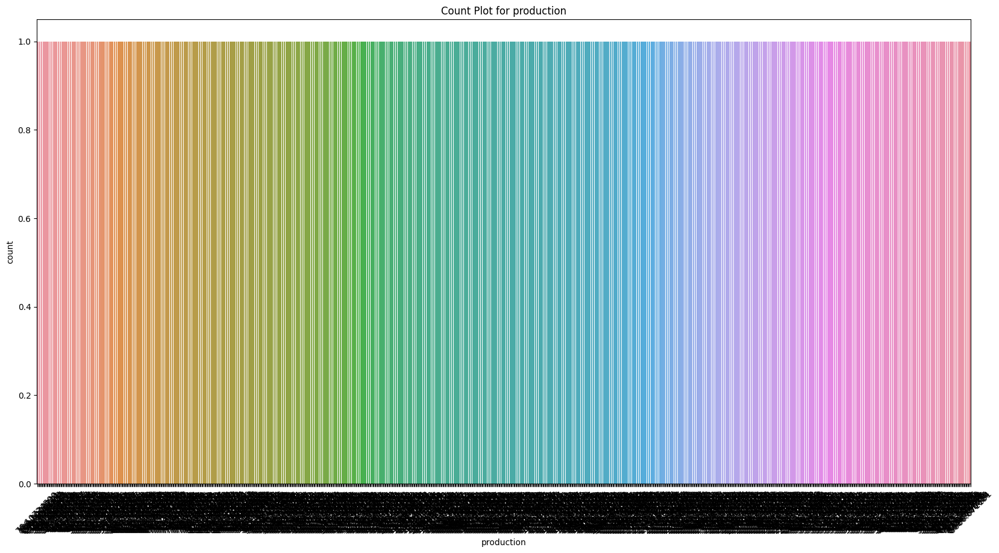

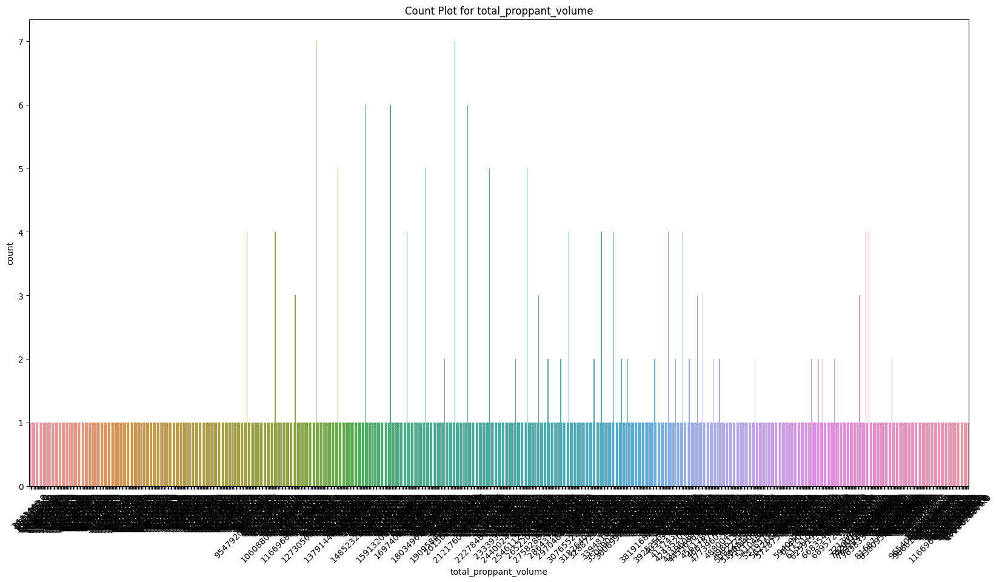

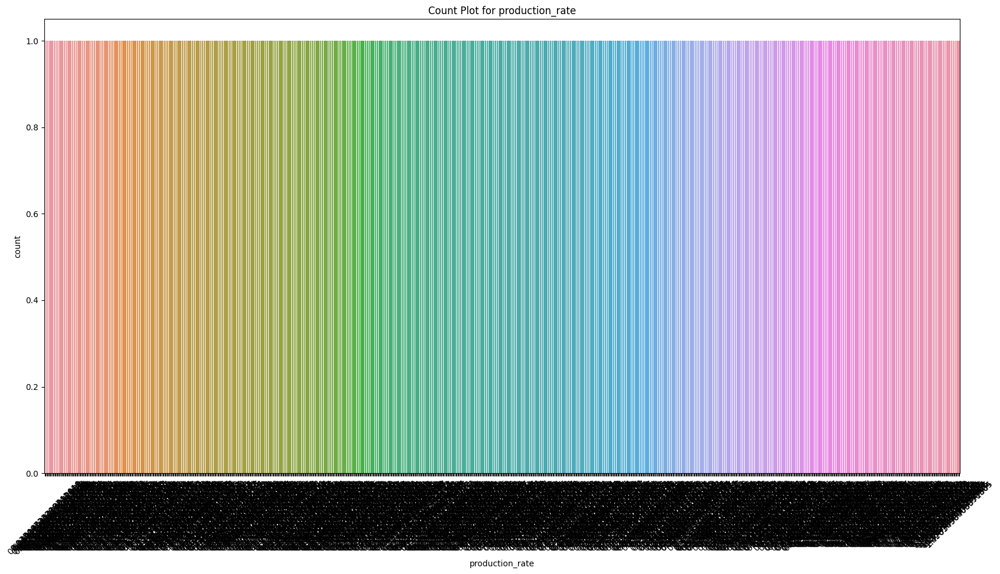

In [54]:
for column in df.columns:
    plt.figure(figsize=(20, 10))
    sns.countplot(data=df, x=column)
    plt.title(f'Count Plot for {column}')
    plt.xticks(rotation=45)
    plt.show()

### Checking correlation between features

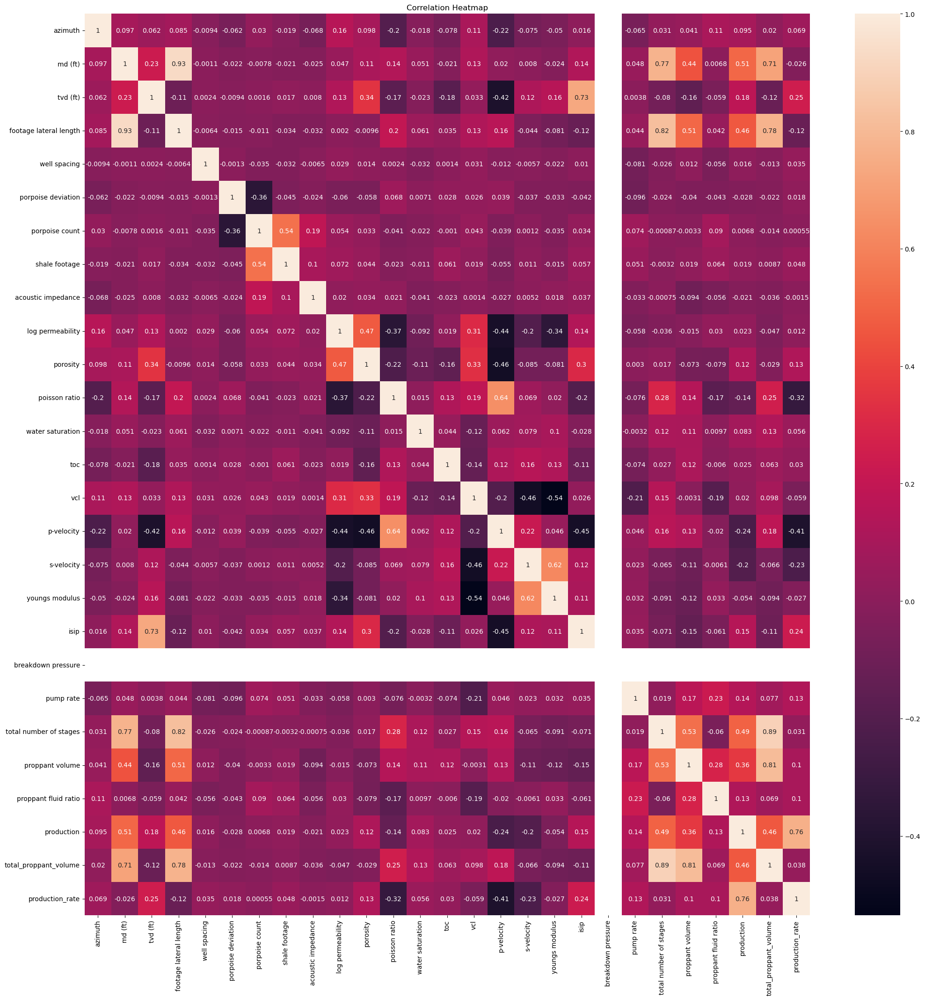

In [67]:
plt.figure(figsize=(25, 25))
sns.heatmap(correlation_matrix, annot=True)
plt.title('Correlation Heatmap')
plt.show()

In [55]:
correlation = df.corr().tail(1)
correlation

,azimuth,md (ft),tvd (ft),date on production,footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,...,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production,total_proppant_volume,production_rate
production_rate,0.086398,-0.025624,0.248074,0.141351,-0.118554,0.035353,0.018033,0.000548,0.048359,-0.00146,...,-0.455628,0.239116,0.046782,0.131779,0.030996,0.107537,0.101635,0.764036,0.047195,1.0


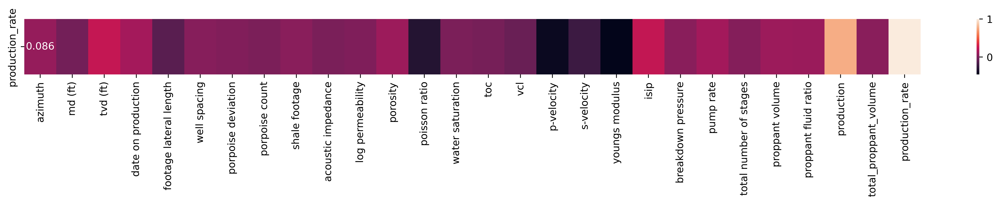

In [56]:
plt.figure(figsize=(20, 1), dpi=500)
sns.heatmap(correlation, annot=True)
plt.show()

In [57]:
corr = df.corr()
corr

,azimuth,md (ft),tvd (ft),date on production,footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,...,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production,total_proppant_volume,production_rate
azimuth,1.000000,0.101063,0.073260,0.027207,0.083504,0.002995,-0.055823,0.022421,-0.028770,-0.065232,...,-0.153491,0.025649,0.004994,-0.055636,0.034639,0.051371,0.103827,0.105535,0.029035,0.086398
md (ft),0.101063,1.000000,0.233517,0.490671,0.932205,-0.001131,-0.021909,-0.007777,-0.020964,-0.024601,...,0.047120,0.138173,0.026121,0.047821,0.773874,0.528580,0.006805,0.511440,0.719794,-0.025624
tvd (ft),0.073260,0.233517,1.000000,-0.081653,-0.106877,0.002391,-0.009362,0.001597,0.017124,0.008029,...,0.001250,0.735716,0.281285,0.003841,-0.080319,-0.147083,-0.059228,0.182881,-0.104875,0.248074
date on production,0.027207,0.490671,-0.081653,1.000000,0.525079,-0.074391,-0.049201,0.033274,0.021453,-0.072637,...,-0.085911,-0.150218,-0.060366,0.209869,0.639012,0.574620,0.110679,0.426800,0.614460,0.141351
footage lateral length,0.083504,0.932205,-0.106877,0.525079,1.000000,-0.006422,-0.015157,-0.011271,-0.034346,-0.031960,...,0.042571,-0.122043,-0.076294,0.044323,0.822597,0.597853,0.042043,0.460939,0.779654,-0.118554
well spacing,0.002995,-0.001131,0.002391,-0.074391,-0.006422,1.000000,-0.001289,-0.035045,-0.032216,-0.006538,...,-0.000102,0.007154,-0.001970,-0.080890,-0.026148,-0.006931,-0.056153,0.015906,-0.025385,0.035353
porpoise deviation,-0.055823,-0.021909,-0.009362,-0.049201,-0.015157,-0.001289,1.000000,-0.360515,-0.044642,-0.023748,...,-0.011244,-0.041016,-0.018812,-0.096416,-0.024435,-0.032151,-0.042619,-0.027703,-0.012518,0.018033
porpoise count,0.022421,-0.007777,0.001597,0.033274,-0.011271,-0.035045,-0.360515,1.000000,0.538351,0.188494,...,0.008516,0.033996,0.018474,0.073659,-0.000872,-0.007936,0.090375,0.006807,-0.015868,0.000548
shale footage,-0.028770,-0.020964,0.017124,0.021453,-0.034346,-0.032216,-0.044642,0.538351,1.000000,0.102726,...,-0.009117,0.055173,0.002959,0.050936,-0.003190,0.005508,0.064279,0.019410,-0.003850,0.048359
acoustic impedance,-0.065232,-0.024601,0.008029,-0.072637,-0.031960,-0.006538,-0.023748,0.188494,0.102726,1.000000,...,0.037760,0.035259,0.043559,-0.033409,-0.000748,-0.104688,-0.055615,-0.020910,-0.046077,-0.001460


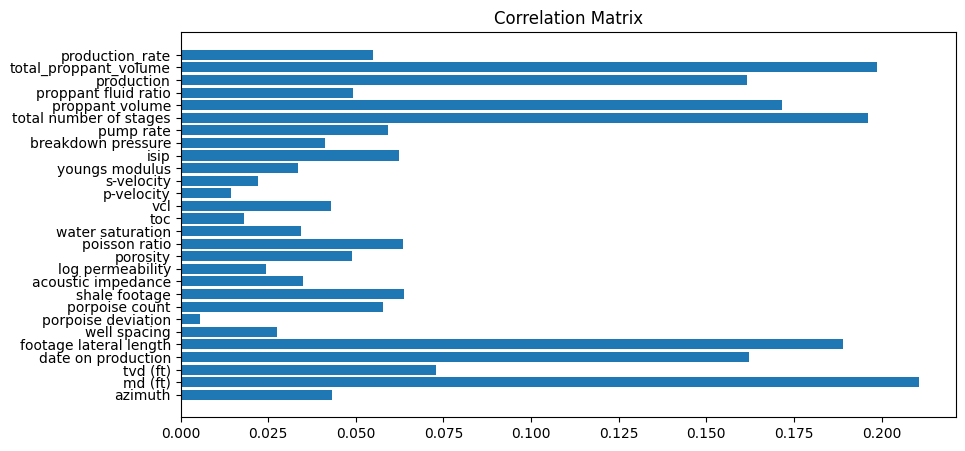

In [58]:
fig,ax = plt.subplots(figsize=(10,5))
ax.barh(corr.columns,corr.mean(),align='center')
#ax.set_xlabel('Correlation Coefficient')
#ax.set_ylabel('Parameters')
ax.set_title('Correlation Matrix')
plt.show()

### Checking Variance

In [59]:
X1 = df.drop('production',axis=1)
X1

,azimuth,md (ft),tvd (ft),date on production,footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,...,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,total_proppant_volume,production_rate
0,-32.279999,19148,6443.0,1519862400,11966.0,4368.462900,6.33,12,1093,30123.20,...,6950.44,30.82,4149.000000,7365.949219,83,56,2.156879e+07,1.23,1.207852e+09,0.469242
1,-19.799999,15150,7602.0,1404172800,6890.0,4714.992200,1.28,4,0,30951.61,...,7162.45,29.72,5776.000000,7365.949219,102,33,9.841307e+06,1.47,3.247631e+08,0.317683
2,-26.879999,14950,5907.0,1533081600,8793.0,798.920960,2.03,6,3254,28900.25,...,6976.93,30.99,4628.000000,7365.949219,88,62,1.711624e+07,1.67,1.061207e+09,0.164908
3,-49.099998,11098,6538.0,1325376000,4234.0,2223.227174,6.00,23,7470,32826.08,...,6799.37,30.84,4582.000000,7365.949219,100,11,3.749559e+06,0.77,4.124515e+07,0.250535
4,5.560000,10549,7024.0,1325376000,2972.0,2967.563000,11.87,9,3637,26740.05,...,7046.91,31.18,4909.000000,7365.949219,94,9,6.690705e+06,1.32,6.021634e+07,0.204418
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,-15.980000,13750,7301.0,1501545600,6006.0,1438.410200,6.30,7,3870,34333.88,...,6853.18,30.59,5235.000000,7365.949219,90,20,7.062412e+06,1.21,1.412482e+08,0.731807
996,-18.080000,17333,6551.0,1519862400,10279.0,764.441650,2.54,17,0,34981.49,...,7031.03,31.14,3796.000000,7365.949219,94,51,1.060880e+07,1.34,5.410488e+08,0.220164
997,-34.430000,19772,7598.0,1538352000,11568.0,569.409910,6.73,8,0,30937.60,...,7250.19,32.20,5751.000000,7365.949219,88,58,2.172056e+07,1.14,1.259792e+09,0.353909
998,-28.540001,11920,5475.0,1533081600,5929.0,2223.227174,6.44,7,0,34744.92,...,6877.28,30.66,4339.000000,7365.949219,100,32,1.343088e+07,0.95,4.297882e+08,0.168712


In [60]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [61]:
variance_inflation_factor(X1.values,1)

1695.3383008787232

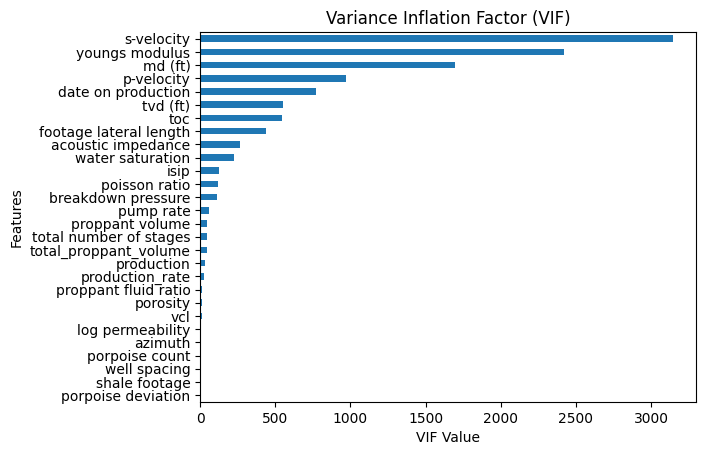

In [62]:
vif_list = []

for i in range(df.shape[1]):
    vif = variance_inflation_factor(df.values, i)
    vif_list.append(round(vif, 2))

s1 = pd.Series(vif_list, index=df.columns)
s1.sort_values().plot(kind='barh')
plt.xlabel('VIF Value')
plt.ylabel('Features')
plt.title('Variance Inflation Factor (VIF)')
plt.show()

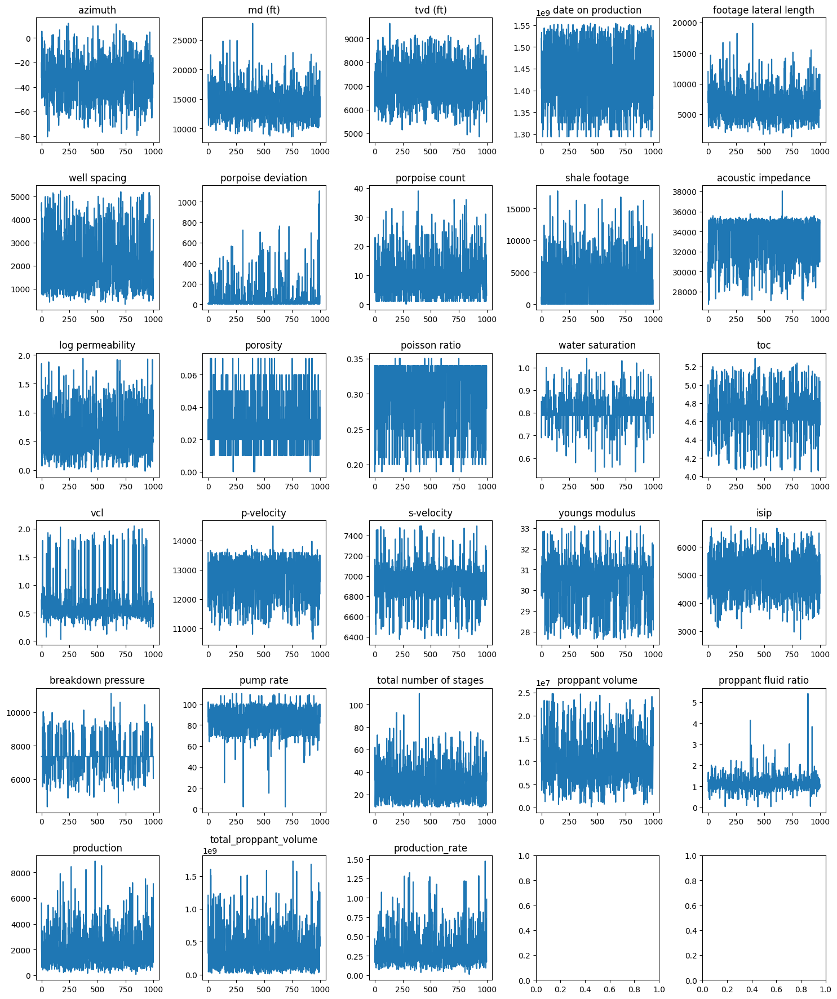

In [63]:
num_cols = df.shape[1]
num_rows = (num_cols + 5 - 1) // 5  # Ceiling division

# Create subplots with an appropriate layout
fig, axes = plt.subplots(nrows=num_rows, ncols=5, figsize=(15, 3 * num_rows))
for col, ax in zip(df.columns, axes.flat):
    df[col].plot(ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

### Feature Selection

##### lineartity

In [64]:
corr

,azimuth,md (ft),tvd (ft),date on production,footage lateral length,well spacing,porpoise deviation,porpoise count,shale footage,acoustic impedance,...,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production,total_proppant_volume,production_rate
azimuth,1.000000,0.101063,0.073260,0.027207,0.083504,0.002995,-0.055823,0.022421,-0.028770,-0.065232,...,-0.153491,0.025649,0.004994,-0.055636,0.034639,0.051371,0.103827,0.105535,0.029035,0.086398
md (ft),0.101063,1.000000,0.233517,0.490671,0.932205,-0.001131,-0.021909,-0.007777,-0.020964,-0.024601,...,0.047120,0.138173,0.026121,0.047821,0.773874,0.528580,0.006805,0.511440,0.719794,-0.025624
tvd (ft),0.073260,0.233517,1.000000,-0.081653,-0.106877,0.002391,-0.009362,0.001597,0.017124,0.008029,...,0.001250,0.735716,0.281285,0.003841,-0.080319,-0.147083,-0.059228,0.182881,-0.104875,0.248074
date on production,0.027207,0.490671,-0.081653,1.000000,0.525079,-0.074391,-0.049201,0.033274,0.021453,-0.072637,...,-0.085911,-0.150218,-0.060366,0.209869,0.639012,0.574620,0.110679,0.426800,0.614460,0.141351
footage lateral length,0.083504,0.932205,-0.106877,0.525079,1.000000,-0.006422,-0.015157,-0.011271,-0.034346,-0.031960,...,0.042571,-0.122043,-0.076294,0.044323,0.822597,0.597853,0.042043,0.460939,0.779654,-0.118554
well spacing,0.002995,-0.001131,0.002391,-0.074391,-0.006422,1.000000,-0.001289,-0.035045,-0.032216,-0.006538,...,-0.000102,0.007154,-0.001970,-0.080890,-0.026148,-0.006931,-0.056153,0.015906,-0.025385,0.035353
porpoise deviation,-0.055823,-0.021909,-0.009362,-0.049201,-0.015157,-0.001289,1.000000,-0.360515,-0.044642,-0.023748,...,-0.011244,-0.041016,-0.018812,-0.096416,-0.024435,-0.032151,-0.042619,-0.027703,-0.012518,0.018033
porpoise count,0.022421,-0.007777,0.001597,0.033274,-0.011271,-0.035045,-0.360515,1.000000,0.538351,0.188494,...,0.008516,0.033996,0.018474,0.073659,-0.000872,-0.007936,0.090375,0.006807,-0.015868,0.000548
shale footage,-0.028770,-0.020964,0.017124,0.021453,-0.034346,-0.032216,-0.044642,0.538351,1.000000,0.102726,...,-0.009117,0.055173,0.002959,0.050936,-0.003190,0.005508,0.064279,0.019410,-0.003850,0.048359
acoustic impedance,-0.065232,-0.024601,0.008029,-0.072637,-0.031960,-0.006538,-0.023748,0.188494,0.102726,1.000000,...,0.037760,0.035259,0.043559,-0.033409,-0.000748,-0.104688,-0.055615,-0.020910,-0.046077,-0.001460


In [65]:
# columns_to_select = ['md (ft)', 'tvd (ft)', 'date on production', 'footage lateral length',
#                      'porpoise count', 'shale footage', 'acoustic impedance', 'log permeability', 'porosity',
#                      'poisson ratio', 'vcl', 'p-velocity', 'isip', 'total number of stages', 'proppant volume', 'production']

# df_new = df[columns_to_select]
#print(df_new)

In [66]:
df.drop(['azimuth', 'well spacing', 'porpoise deviation',
       'log permeability', 'water saturation',
       'toc', 's-velocity',
       'pump rate'],axis=1,inplace=True)


In [80]:
df.head(2)

,md (ft),tvd (ft),date on production,footage lateral length,porpoise count,shale footage,acoustic impedance,porosity,poisson ratio,vcl,p-velocity,youngs modulus,isip,breakdown pressure,total number of stages,proppant volume,proppant fluid ratio,production,total_proppant_volume,production_rate
0,19148,6443.0,1519862400,11966.0,12,1093,30123.20,0.020000,0.34,0.42,13592.23,30.82,4149.0,7365.949219,56,21568792.0,1.23,5614.947951,1.207852e+09,0.469242
1,15150,7602.0,1404172800,6890.0,4,0,30951.61,0.032338,0.19,0.74,11735.04,29.72,5776.0,7365.949219,33,9841307.0,1.47,2188.836707,3.247631e+08,0.317683


In [81]:
df.columns

Index(['md (ft)', 'tvd (ft)', 'date on production', 'footage lateral length',
       'porpoise count', 'shale footage', 'acoustic impedance', 'porosity',
       'poisson ratio', 'vcl', 'p-velocity', 'youngs modulus', 'isip',
       'breakdown pressure', 'total number of stages', 'proppant volume',
       'proppant fluid ratio', 'production', 'total_proppant_volume',
       'production_rate'],
      dtype='object')

In [92]:
df.to_csv('./data/testing.csv',index=False)

In [68]:
df.shape

(1000, 20)

In [69]:
x = df.drop('production',axis=1)
y = df['production']

### Linear Regression

In [70]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=11)

Linear_model = LinearRegression()

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=11)

Linear_model.fit(x_train, y_train)

LinearRegression()

In [82]:
y_test

25     3187.190755
464    1957.471727
372     374.037353
730    1690.704179
757    4097.528584
          ...     
278    1555.761614
449    1498.904494
221    1347.502912
741    1430.793384
572    1673.660579
Name: production, Length: 200, dtype: float64

In [77]:
y_test.values

array([3187.190755 , 1957.471727 ,  374.0373534, 1690.704179 ,
       4097.528584 , 2929.769762 , 2893.163534 , 3222.742114 ,
        725.4743944, 3514.792459 , 1268.545581 , 1010.513559 ,
        942.1315053, 2802.056243 , 1185.096113 , 1195.757733 ,
       4153.992822 , 1772.86068  ,  653.7166002,  876.2633795,
       3239.216718 , 8230.697526 , 1274.756362 ,  953.7184041,
       1251.382264 , 1830.203588 ,  962.313461 , 5258.248058 ,
       5463.968098 , 1496.843724 ,  504.4295346,  763.1089295,
        768.8105398,  565.7296862, 3762.549877 ,  558.2843148,
       3147.658977 ,  555.4331335,  952.0824585, 2666.898878 ,
       5077.423125 ,  662.9539522,  836.5984835, 2355.901192 ,
       2943.45403  ,  866.1471964, 2750.054206 , 2417.129505 ,
        709.1398239,  664.3210982,  799.576917 ,  541.0174495,
       1889.567799 , 3056.092595 , 2046.433338 , 2091.234148 ,
       1507.253422 , 1172.315251 ,  342.419261 , 1310.394358 ,
        541.5577054, 5262.395867 , 8444.751759 , 3315.4

In [83]:
y_pred = Linear_model.predict(x_test)
print(y_pred)

[ 3.58493592e+03  2.11032485e+03  7.14888069e+00  2.24470287e+03
  3.37310866e+03  2.91753146e+03  2.83475511e+03  3.52671207e+03
  5.60616734e+02  3.39841820e+03  1.59646529e+03  1.03855018e+03
  9.95955261e+02  2.78760168e+03  1.08731959e+03  1.22789653e+03
  3.76184647e+03  1.75312950e+03  4.56787477e+02  1.07254164e+03
  2.90378160e+03  6.34752206e+03  1.32368707e+03  8.86238975e+02
  1.26823682e+03  1.89841576e+03  9.95315316e+02  4.46771771e+03
  5.52768450e+03  1.93359549e+03  4.35393663e+02  5.76434074e+02
  9.99588404e+02  2.41004266e+02  3.26680395e+03  3.91613785e+02
  3.30302918e+03  3.88161125e+02  1.11166944e+03  2.55300713e+03
  4.20985717e+03  6.40779334e+02  6.86938620e+02  2.16801446e+03
  2.86359977e+03  1.13009653e+03  2.79560552e+03  2.63643913e+03
  7.56752807e+02  4.91463650e+02  6.83897282e+02  6.24156259e+02
  1.94484273e+03  2.91186152e+03  2.28798469e+03  2.03085451e+03
  1.89830707e+03  1.73526355e+03  4.06529846e+01  1.33248885e+03
  3.03052744e+02  4.35936

In [79]:
# Plot actual vs predicted values as a scatter plot
import streamlit as st
# Plot actual vs predicted values as a line graph
st.write("Actual vs Predicted Values")
plt.figure(figsize=(8, 6))
plt.plot(y_test.values, y_pred, marker='o', label='Actual', color='blue', linestyle='-', markersize=8)
plt.plot(y_test.values, y_pred, marker='x', label='Predicted', color='green', linestyle='--', markersize=8)
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('Actual vs Predicted Values (Line Graph)')
plt.legend()
st.pyplot(plt)

DeltaGenerator()

### Evaluation of Train Data

In [72]:
def linear_train():
    mse = mean_squared_error(y_test,y_pred)
    print("Mean Squared Error :",mse)

    rmse = np.sqrt(mse)
    print("Root Mean Squared Error :",rmse)

    mae = mean_absolute_error(y_test,y_pred)
    print("Mean Absolute error :",mae)

    r_squared = r2_score(y_test,y_pred)
    print("R Squared Value :",r_squared)

    score = Linear_model.score(x_test,y_test)
    print("Accuracy :",score*100,"%")

linear_train()
    

Mean Squared Error : 273275.59572005185
Root Mean Squared Error : 522.7576835590768
Mean Absolute error : 306.5780940219746
R Squared Value : 0.8895409640014206
Accuracy : 88.95409640014206 %


In [73]:
y_pred_train= Linear_model.predict(x_train)
print(y_pred_train)

[ 1.02963226e+03  5.49858523e+03  2.05619637e+03  5.94945407e+02
  1.20991867e+03  3.66678529e+02  3.48689254e+03  1.92223197e+03
  1.92243220e+03  3.58409303e+03  3.79451060e+03  1.92116552e+03
  1.05253468e+03  4.69446604e+01  2.50535594e+02  1.02608084e+03
  4.33977495e+03  2.85541693e+03  9.06357769e+02  2.95252598e+03
  1.59953733e+03  2.96334617e+03  1.71006980e+03  4.09719687e+02
  3.08433653e+03  1.29433482e+03  1.72440453e+03  8.02119086e+02
  9.86015596e+02  2.19586831e+03  3.13739111e+03  5.18720478e+02
  2.23249952e+02  1.05000179e+03  1.37345805e+03  1.98826094e+03
  1.71679397e+03  3.88995888e+03  1.51878672e+03  3.43829070e+03
  1.82499315e+03  1.28252202e+03  1.89297210e+03  2.64244021e+03
  9.83033895e+02  1.53315593e+03  9.09203829e+02  3.07320371e+03
  3.63260210e+03  3.79452488e+02  4.49965685e+03  3.54924962e+03
  1.49020695e+03  6.25947325e+02  2.57421715e+03  1.71815291e+03
  3.17117184e+03  2.47015705e+03 -2.74281263e+01  5.28664348e+03
  2.00326270e+03  2.69805

### Evaluation of Test Data

In [74]:
def linear_test():
    
    mse = mean_squared_error(y_train,y_pred_train)
    print("Mean Squared Error :",mse)

    rmse = np.sqrt(mse)
    print("Root Mean Squared Error :",rmse)

    mae = mean_absolute_error(y_train,y_pred_train)
    print("Mean Absolute error :",mae)

    r_squared = r2_score(y_train,y_pred_train)
    print("R Squared Value :",r_squared)

    score = Linear_model.score(x_train,y_train)
    print("Accuracy :",score*100,"%")
linear_test()

Mean Squared Error : 168325.64595539978
Root Mean Squared Error : 410.275085711282
Mean Absolute error : 256.3870578676762
R Squared Value : 0.8986203209328264
Accuracy : 89.86203209328264 %


### Scaling

In [75]:
def scaling():
    
    # Initialize the StandardScaler
    scaler = StandardScaler()

    # Fit the scaler on the training data and transform both training and test data
    X_train_scaled = scaler.fit_transform(x_train)
    X_test_scaled = scaler.transform(x_test)

    model = LinearRegression()
    model.fit(X_train_scaled, y_train)

    score = model.score(X_test_scaled, y_test)
    print("R-squared score on scaled Test Data:", score)

    score = model.score(X_train_scaled, y_train)
    print("R-squared score on scaled Train Data:", score)

scaling()

R-squared score on scaled Test Data: 0.889540964001804
R-squared score on scaled Train Data: 0.8986203209328264


### XgBoost

In [84]:
# Initialize the XGBoost model
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# Fit the model on the training data
xgb_model.fit(x_train, y_train)


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

### Evaluation On Testing Data

In [85]:
def xgboost_train():
    # Make predictions on the testing data
    y_pred_xgb = xgb_model.predict(x_test)

    mse_xgb = mean_squared_error(y_test, y_pred_xgb)
    print("Mean Squared Error:", mse_xgb)

    # Calculate Root Mean Squared Error
    rmse_xgb = np.sqrt(mse_xgb)
    print("Root Mean Squared Error:", rmse_xgb)

    # Calculate Mean Absolute Error
    mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
    print("Mean Absolute Error:", mae_xgb)

    # Calculate R-squared value
    r_squared_xgb = r2_score(y_test, y_pred_xgb)
    print("R Squared Value:", r_squared_xgb)

    Accuracy_xgb = xgb_model.score(x_test, y_test)
    print("Accuracy for Testing :", Accuracy_xgb * 100, "%")

xgboost_train()

Mean Squared Error: 165030.8270627848
Root Mean Squared Error: 406.239863950825
Mean Absolute Error: 134.6368088172998
R Squared Value: 0.9332939115204502
Accuracy for Testing : 93.32939115204502 %


### With Hyperparameter Tuning

In [87]:
# Hyperparameter 
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=43)

# Fit the model on the training data
xgb_model.fit(x_train, y_train)

# Make predictions on the testing data
y_pred_xgb = xgb_model.predict(x_test)

def hyper_xgb():
    # Calculate Mean Squared Error
    mse_xgb = mean_squared_error(y_test, y_pred_xgb)
    print("Mean Squared Error:", mse_xgb)

    # Calculate Root Mean Squared Error
    rmse_xgb = np.sqrt(mse_xgb)
    print("Root Mean Squared Error:", rmse_xgb)

    # Calculate Mean Absolute Error
    mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
    print("Mean Absolute Error:", mae_xgb)

    # Calculate R-squared value
    r_squared_xgb = r2_score(y_test, y_pred_xgb)
    print("R Squared Value:", r_squared_xgb)


hyper_xgb()

Mean Squared Error: 165030.8270627848
Root Mean Squared Error: 406.239863950825
Mean Absolute Error: 134.6368088172998
R Squared Value: 0.9332939115204502


### Evaluation on Training Data

In [88]:
# Make predictions on the testing data
y_train_xgb = xgb_model.predict(x_train)

In [89]:
def eval_train():
    mse_xgb = mean_squared_error(y_train, y_train_xgb)
    print("Mean Squared Error:", mse_xgb)

    # Calculate Root Mean Squared Error
    rmse_xgb = np.sqrt(mse_xgb)
    print("Root Mean Squared Error:", rmse_xgb)

    # Calculate Mean Absolute Error
    mae_xgb = mean_absolute_error(y_train, y_train_xgb)
    print("Mean Absolute Error:", mae_xgb)

    # Calculate R-squared value
    r_squared_xgb = r2_score(y_train, y_train_xgb)
    print("R Squared Value:", r_squared_xgb)
    
    Accuracy_xgb1 = xgb_model.score(x_train, y_train)
    print("Accuracy on Training Data:", Accuracy_xgb1 * 100, "%")
    
eval_train()

Mean Squared Error: 236.62119396878253
Root Mean Squared Error: 15.382496350358174
Mean Absolute Error: 11.802771401612599
R Squared Value: 0.9998574870717478
Accuracy on Training Data: 99.98574870717478 %


### with Hyperparameter Tunning

In [90]:
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

In [91]:
# Define the hyperparameters and values to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2,3]
}

In [109]:
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=6, n_jobs=-1, verbose=2)

In [110]:
# Fit the GridSearchCV on the training data
grid_search.fit(x_train, y_train)

Fitting 6 folds for each of 81 candidates, totalling 486 fits


GridSearchCV(cv=6,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=0.1, ma...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=42, ...),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 4, 5], 'min_child_weight': [1, 2, 3],
                         'n_estimators': [50, 100, 200]},
             verbose=2)

In [111]:
best_xgb_model = grid_search.best_estimator_

In [112]:
# Make predictions on the training and testing data
y_train_pred = best_xgb_model.predict(x_train)
y_test_pred = best_xgb_model.predict(x_test)

In [113]:
# Calculate R-squared values for training and testing data
r_squared_train = r2_score(y_train, y_train_pred)
r_squared_test = r2_score(y_test, y_test_pred)

In [115]:
def result():
    print("Best Hyperparameters:", grid_search.best_params_)
    print("R Squared (Training Data):", r_squared_train)
    print("R Squared (Testing Data):", r_squared_test)
result()

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 200}
R Squared (Training Data): 0.9993939245278008
R Squared (Testing Data): 0.9556773148056037


### Random Forest Regression

In [116]:
# Initialize the RandomForestRegressor model
rf_model = RandomForestRegressor(n_estimators=100, random_state=10)

rf_model.fit(x_train, y_train)

# Make predictions on the testing data
y_test_rf = rf_model.predict(x_test)

### Evaluation on Training Data

In [118]:
def random_train():
    #Eval
    y_train_rf = rf_model.predict(x_train)

    mse_rf = mean_squared_error(y_train, y_train_rf)
    print("Mean Squared Error:", mse_rf)

    # Calculate Root Mean Squared Error
    rmse_rf = np.sqrt(mse_rf)
    print("Root Mean Squared Error:", rmse_rf)

    # Calculate Mean Absolute Error
    mae_rf = mean_absolute_error(y_train, y_train_rf)
    print("Mean Absolute Error:", mae_rf)

    # Calculate R-squared value
    r_squared_rf = r2_score(y_train, y_train_rf)
    print("R Squared Value:", r_squared_rf)
    
random_train()

Mean Squared Error: 8529.408648126135
Root Mean Squared Error: 92.35479764541816
Mean Absolute Error: 42.23967489385756
R Squared Value: 0.9948628819662517


### Evaluation on Testing Data

In [120]:
def random_test():
    mse_rf = mean_squared_error(y_test, y_test_rf)
    print("Mean Squared Error:", mse_rf)

    # Calculate Root Mean Squared Error
    rmse_rf = np.sqrt(mse_rf)
    print("Root Mean Squared Error:", rmse_rf)

    # Calculate Mean Absolute Error
    mae_rf = mean_absolute_error(y_test, y_test_rf)
    print("Mean Absolute Error:", mae_rf)

    # Calculate R-squared value
    r_squared_rf = r2_score(y_test, y_test_rf)
    print("R Squared Value:", r_squared_rf)

    


random_test()

Mean Squared Error: 181589.2360092669
Root Mean Squared Error: 426.1328853881931
Mean Absolute Error: 153.4725730142079
R Squared Value: 0.9266009395956085


### With HyperParameter Tuning

In [ ]:
#With Hyperparameter 
# Define the hyperparameters and values to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the GridSearchCV on the training data
grid_search.fit(x_train, y_train)

# Get the best estimator from the grid search
best_rf_model = grid_search.best_estimator_

# Make predictions on the training and testing data
y_train_pred_rf = best_rf_model.predict(x_train)
y_test_pred_rf = best_rf_model.predict(x_test)

# Calculate R-squared values for training and testing data
r_squared_train_rf = r2_score(y_train, y_train_pred_rf)
r_squared_test_rf = r2_score(y_test, y_test_pred_rf)

print("Best Hyperparameters:", grid_search.best_params_)
print("R Squared (Training Data):", r_squared_train_rf)
print("R Squared (Testing Data):", r_squared_test_rf)



In [121]:
# with Hyperparameter Tuning 
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)

# Define the hyperparameters and values to search
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2,3]
}

grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=6, n_jobs=-1, verbose=2)

# Fit the GridSearchCV on the training data
grid_search.fit(x_train, y_train)

best_xgb_model = grid_search.best_estimator_

# Make predictions on the training and testing data
y_train_pred = best_xgb_model.predict(x_train)
y_test_pred = best_xgb_model.predict(x_test)

# Calculate R-squared values for training and testing data
r_squared_train = r2_score(y_train, y_train_pred)
r_squared_test = r2_score(y_test, y_test_pred)


Fitting 6 folds for each of 81 candidates, totalling 486 fits


In [122]:
def result_hyper1():
    print("Best Hyperparameters:", grid_search.best_params_)
    print("R Squared (Training Data):", r_squared_train)
    print("R Squared (Testing Data):", r_squared_test)
result_hyper1()

Best Hyperparameters: {'learning_rate': 0.2, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 200}
R Squared (Training Data): 0.9993939245278008
R Squared (Testing Data): 0.9556773148056037


### Gradient Boosting Regression

In [123]:
gb_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.2, random_state=60)

gb_model.fit(x_train, y_train)

GradientBoostingRegressor(learning_rate=0.2, random_state=60)

In [124]:
y_pred_test_gb = gb_model.predict(x_test)

### Evaluation on Test Data

In [125]:
def Grad_Train():
    mse_rf = mean_squared_error(y_test, y_pred_test_gb)
    print("Mean Squared Error:", mse_rf)

    # Calculate Root Mean Squared Error
    rmse_rf = np.sqrt(mse_rf)
    print("Root Mean Squared Error:", rmse_rf)

    # Calculate Mean Absolute Error
    mae_rf = mean_absolute_error(y_test, y_pred_test_gb)
    print("Mean Absolute Error:", mae_rf)

    # Calculate R-squared value
    r_squared_rf = r2_score(y_test, y_pred_test_gb)
    print("R Squared Value:", r_squared_rf)
Grad_Train()

Mean Squared Error: 99886.1241764934
Root Mean Squared Error: 316.04766124192946
Mean Absolute Error: 134.90084117367252
R Squared Value: 0.95962564839682


### with Hyperparameter Tunning

In [128]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [15,10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# Fit the GridSearchCV on the training data
grid_search.fit(x_train, y_train)
# Get the best estimator from the grid search
best_rf_model = grid_search.best_estimator_



Fitting 3 folds for each of 81 candidates, totalling 243 fits


In [129]:
def pred_test_rf():
    # Make predictions on the testing data
    y_pred_test_rf = best_rf_model.predict(x_test)

    # Calculate Mean Squared Error
    mse_rf = mean_squared_error(y_test, y_pred_test_rf)
    print("Mean Squared Error:", mse_rf)

    # Calculate Root Mean Squared Error
    rmse_rf = np.sqrt(mse_rf)
    print("Root Mean Squared Error:", rmse_rf)

    # Calculate Mean Absolute Error
    mae_rf = mean_absolute_error(y_test, y_pred_test_rf)
    print("Mean Absolute Error:", mae_rf)

    # Calculate R-squared value
    r_squared_rf = r2_score(y_test, y_pred_test_rf)
    print("R Squared Value:", r_squared_rf)
    
pred_test_rf()

Mean Squared Error: 181205.64516531047
Root Mean Squared Error: 425.68256384929657
Mean Absolute Error: 152.66849890002067
R Squared Value: 0.9267559884748532


### Evaluation on Training Data

In [130]:
def  train_rf():
    y_pred_train_gb = gb_model.predict(x_train)

    mse_rf = mean_squared_error(y_train, y_pred_train_gb)
    print("Mean Squared Error:", mse_rf)

    # Calculate Root Mean Squared Error
    rmse_rf = np.sqrt(mse_rf)
    print("Root Mean Squared Error:", rmse_rf)

    # Calculate Mean Absolute Error
    mae_rf = mean_absolute_error(y_train, y_pred_train_gb)
    print("Mean Absolute Error:", mae_rf)

    # Calculate R-squared value
    r_squared_rf = r2_score(y_train, y_pred_train_gb)
    print("R Squared Value on Training Data:", r_squared_rf)
train_rf()

Mean Squared Error: 2970.3132539161043
Root Mean Squared Error: 54.5005803080674
Mean Absolute Error: 41.74630112308783
R Squared Value: 0.9982110307511265


### Grid Research CV

In [131]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(estimator=gb_model, param_grid=param_grid, cv=2, n_jobs=-1, verbose=2)

grid_search.fit(x_train, y_train)
best_gb_model = grid_search.best_estimator_
best_gb_model

# Make predictions on the training and testing data
y_train_pred_gb = best_gb_model.predict(x_train)
y_test_pred_gb = best_gb_model.predict(x_test)

# Calculate R-squared values for training and testing data
r_squared_train_gb = r2_score(y_train, y_train_pred_gb)
r_squared_test_gb = r2_score(y_test, y_test_pred_gb)



Fitting 2 folds for each of 243 candidates, totalling 486 fits


In [132]:
def result():
    print("Best Hyperparameters:", grid_search.best_params_)
    print("R Squared (Training Data):", r_squared_train_gb)
    print("R Squared (Testing Data):", r_squared_test_gb)
result()

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
R Squared (Training Data): 0.998733912135383
R Squared (Testing Data): 0.9605102506452996


### Light GBM

In [133]:
lgb_model = lgb.LGBMRegressor(n_estimators=100, random_state=30, force_col_wise=True)

# Fit the model on the training data
lgb_model.fit(x_train, y_train)

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Total Bins 2949
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 18
[LightGBM] [Info] Start training from score 1929.866717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

LGBMRegressor(force_col_wise=True, random_state=30)

In [135]:
def lgb_result():
    y_pred_lgb = lgb_model.predict(x_test)
    y_pred_lgb

    r_squared_lgb = r2_score(y_test, y_pred_lgb)
    print("R Squared Value on Test Data:", r_squared_lgb)

    y_pred_train_lgb = lgb_model.predict(x_train)
    y_pred_train_lgb

    r_squared_lgb = r2_score(y_train, y_pred_train_lgb)
    print("R Squared Value on Train Data:", r_squared_lgb)

lgb_result()

R Squared Value on Test Data: 0.9372095093829219
R Squared Value on Train Data: 0.9891929365814757


### Hyperparameter Tuning

In [136]:
# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=lgb_model, param_grid=param_grid, cv=4, n_jobs=-1, verbose=3)

# Fit the GridSearchCV on the training data
grid_search.fit(x_train, y_train)

Fitting 4 folds for each of 243 candidates, totalling 972 fits
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Info] Total Bins 2949
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 18
[LightGBM] [Info] Start training from score 1929.866717
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits 

GridSearchCV(cv=4,
             estimator=LGBMRegressor(force_col_wise=True, random_state=30),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 4, 5], 'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             verbose=3)

In [137]:
best_lgb_model = grid_search.best_estimator_
best_lgb_model

# Make predictions on the training and testing data
y_train_pred_lgb = best_lgb_model.predict(x_train)
y_test_pred_lgb = best_lgb_model.predict(x_test)


[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split


In [138]:
def lgb_result():
    # Calculate R-squared values for training and testing data
    r_squared_train_lgb = r2_score(y_train, y_train_pred_lgb)
    r_squared_test_lgb = r2_score(y_test, y_test_pred_lgb)

    print("Best Hyperparameters:", grid_search.best_params_)
    print("R Squared (Training Data):", r_squared_train_lgb)
    print("R Squared (Testing Data):", r_squared_test_lgb)

lgb_result()

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 200}
R Squared (Training Data): 0.9984650145779348
R Squared (Testing Data): 0.9591139888594713


### Testing on Single Row

In [144]:
import pickle

In [145]:
x.head(1).T

,0
md (ft),1.914800e+04
tvd (ft),6.443000e+03
date on production,1.519862e+09
footage lateral length,1.196600e+04
porpoise count,1.200000e+01
shale footage,1.093000e+03
acoustic impedance,3.012320e+04
porosity,2.000000e-02
poisson ratio,3.400000e-01
vcl,4.200000e-01


In [ ]:
md (ft)             = 1.914800e+04
tvd (ft)	        = 6.443000e+03
date on production	= 1.519862e+09
footage lateral length = 1.196600e+04
porpoise count	    = 1.200000e+01
shale footage	    = 1.093000e+03
acoustic impedance	= 3.012320e+04
porosity	        = 2.000000e-02
poisson ratio	    = 3.400000e-01
vcl	                = 4.200000e-01
p-velocity	        = 1.359223e+04
youngs modulus	    = 3.082000e+01
isip	            = 4.149000e+03
breakdown pressure	= 7.365949e+03
total number of stages = 5.600000e+01
proppant volume	    = 2.156879e+07
proppant fluid ratio = 1.230000e+00
total_proppant_volume = 1.207852e+09
production_rate	    = 4.692418e-01

In [147]:
test_array = np.array([1.914,6.443,1.519,1.196,1.200000e+01,1.093000e+03,3.012320e+04,2.000000e-02,3.400000e-01,4.200000e-01,1.359223e+04,
                      3.082000e+01,4.149000e+03,7.365949e+03,5.600000e+01,2.156879e+07,1.230000e+00,1.207852e+09,4.692418e-01],ndmin=2)
test_array

array([[1.914000e+00, 6.443000e+00, 1.519000e+00, 1.196000e+00,
        1.200000e+01, 1.093000e+03, 3.012320e+04, 2.000000e-02,
        3.400000e-01, 4.200000e-01, 1.359223e+04, 3.082000e+01,
        4.149000e+03, 7.365949e+03, 5.600000e+01, 2.156879e+07,
        1.230000e+00, 1.207852e+09, 4.692418e-01]])

##### Prediction On LGB 

In [161]:
result_lgb = best_lgb_model.predict(test_array)
print(f'Oil Production :',result_lgb)


[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=4. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Unknown parameter: min_samples_split
Oil Production : [1440.37012114]


In [162]:
with open("LGB_Model.pkl",'wb') as f:
    pickle.dump(best_lgb_model,f)

##### Prediction On XgBoost

In [155]:
result_xgb = best_xgb_model.predict(test_array)
print(f'Oil Production :',result_xgb)

Oil Production : [1137.731]


In [156]:
with open("XGboost_Model.pkl",'wb') as f:
    pickle.dump(best_xgb_model,f)

##### Prediction On Random Forest Regression

In [157]:
result_rfg = best_rf_model.predict(test_array)
print(f'Oil Production :',result_rfg)


Oil Production : [1772.47216425]


In [158]:
with open("ran_for_reg_Model.pkl",'wb') as f:
    pickle.dump(best_xgb_model,f)

### Prediction On Gradient Boosting Regression

In [159]:
result_gbr = gb_model.predict(test_array)
print(f'Oil Production :',result_gbr)

Oil Production : [1719.14044122]


In [160]:
with open("grad_bos_reg_Model.pkl",'wb') as f:
    pickle.dump(gb_model,f)